# Decompositions and Plots

In [1]:
import numpy as np
import h5py
import torch
import matplotlib.pyplot as plt


In [2]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sat Jan 31 22:20:32 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   31C    P0             41W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [3]:
# Import google drive mounting module
from google.colab import drive

# Import os/path lib to navigate the colab directory.
import os
import pathlib


# Mount Google Drive at the default location
drive.mount('/content/drive', force_remount=False)
# Define the path to your desired folder
path = '/content/drive/My Drive/OPM-MEG'
# Change to that directory
os.chdir(path)
# Verify the current working directory
print("Current Directory:", os.getcwd())

Mounted at /content/drive
Current Directory: /content/drive/My Drive/OPM-MEG


In [4]:
!git clone https://github.com/hug0-w/Tensor-Decompositions-OPM-MEG/
!pip install tensorly

Cloning into 'Tensor-Decompositions-OPM-MEG'...
remote: Enumerating objects: 458, done.
remote: Counting objects: 100% (142/142), done.
remote: Compressing objects: 100% (112/112), done.
remote: Total 458 (delta 68), reused 82 (delta 29), pack-reused 316 (from 1)
Receiving objects: 100% (458/458), 46.83 MiB | 16.72 MiB/s, done.
Resolving deltas: 100% (215/215), done.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 138.4 MB/s eta 0:00:00


In [5]:
!pip install nilearn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.6/10.6 MB 86.1 MB/s eta 0:00:00


# Outcome

In [225]:
mat_file = 'TFR_Outcome_ROI_Averaged.mat'

with h5py.File(mat_file, 'r') as f:
    # Load raw and baseline-normalized tensors
    tensor = np.array(f['TFR_full'])           # [Trials x ROIs x Freq x Time] - raw power
    tensor_norm = np.array(f['pow_norm']) # [Trials x ROIs x Freq x Time] - baseline normalized

    time_vec = np.array(f['time_vec']).flatten()
    freq_vec = np.array(f['freq_vec']).flatten()

    # ROI labels (stored as HDF5 references)
    roi_labels = [''.join(chr(c) for c in f[ref][:].flatten()) for ref in f['roi_labels'][:].flatten()]

print(f"Tensor shape (raw): {tensor.shape}")
print(f"Tensor shape (normalized): {tensor_norm.shape}")
print(f"Time: {time_vec[0]*1000:.0f} to {time_vec[-1]*1000:.0f} ms ({len(time_vec)} points)")
print(f"Freq: {freq_vec[0]:.0f} to {freq_vec[-1]:.0f} Hz ({len(freq_vec)} points)")
print(f"ROIs: {len(roi_labels)}")



Tensor shape (raw): (6,)
Tensor shape (normalized): (81, 42, 120)
Time: 0 to 800 ms (81 points)
Freq: 4 to 45 Hz (42 points)
ROIs: 120


In [224]:
# Find which tissues are missing
tissue_nums = {int(label.replace("tissue", "").strip()) for label in roi_labels}
missing = sorted(set(range(1, 121)) - tissue_nums)
print(f"Missing: {missing}")

Missing: []


In [226]:
tensor = tensor.T
tensor_norm = tensor_norm.T

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Average TFR across ROIs
mean_tfr = pow_norm.mean(axis=0)  # [Freq x Time]

# Plot to see if there ARE distinct bands
fig, axes = plt.subplots(1, 3, figsize=(14, 4))

# TFR
axes[0].imshow(mean_tfr, aspect='auto', origin='lower',
               extent=[time_vec[0]*1000, time_vec[-1]*1000, freq_vec[0], freq_vec[-1]])
axes[0].set_xlabel('Time (ms)')
axes[0].set_ylabel('Frequency (Hz)')
axes[0].set_title('Mean TFR')

# Mean spectrum (time-averaged)
axes[1].plot(freq_vec, mean_tfr.mean(axis=1), 'b-', linewidth=2)
axes[1].set_xlabel('Frequency (Hz)')
axes[1].set_ylabel('Power')
axes[1].set_title('Mean Spectrum')
axes[1].axhline(0, color='k', linestyle='--')

# Time courses per band
bands = {'theta': (4,8), 'alpha': (8,13), 'beta': (13,30), 'gamma': (30,45)}
for name, (lo, hi) in bands.items():
    idx = (freq_vec >= lo) & (freq_vec <= hi)
    tc = mean_tfr[idx, :].mean(axis=0)
    axes[2].plot(time_vec*1000, tc, label=name, linewidth=2)
axes[2].set_xlabel('Time (ms)')
axes[2].set_ylabel('Power')
axes[2].set_title('Band Time Courses')
axes[2].legend()

plt.tight_layout()
plt.show()

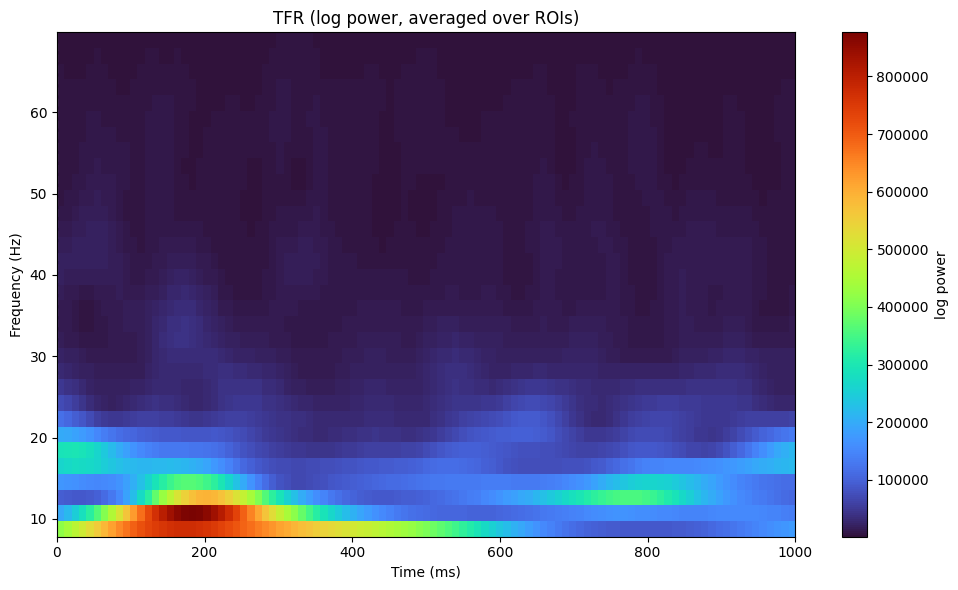

In [214]:
# Average over trials and ROIs
pow_avg = np.nanmean(pow, axis=0)  # [Freq x Time]

plt.figure(figsize=(10, 6))
plt.imshow(pow_avg, aspect='auto', origin='lower',
           extent=[time_vec[0]*1000, time_vec[-1]*1000, freq_vec[0], freq_vec[-1]],cmap='turbo')
plt.xlabel('Time (ms)')
plt.ylabel('Frequency (Hz)')
plt.title('TFR (log power, averaged over ROIs)')
plt.colorbar(label='log power')
plt.axvline(0, color='white', linestyle='--')
plt.tight_layout()
plt.show()

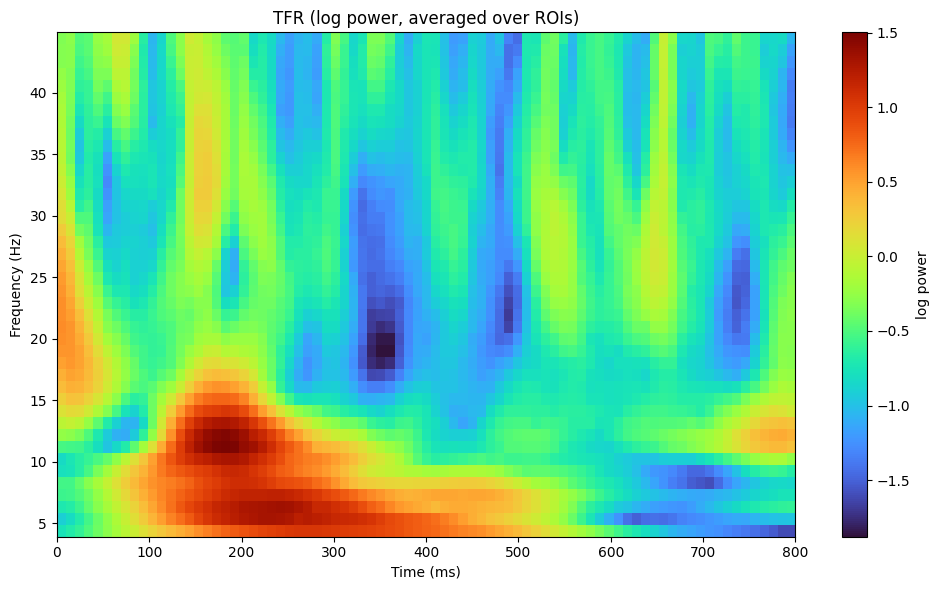

In [236]:
# Average over trials and ROIs
pow_avg = np.nanmean(tensor_norm, axis=(0))  # [Freq x Time]

plt.figure(figsize=(10, 6))
plt.imshow(pow_avg, aspect='auto', origin='lower',
           extent=[time_vec[0]*1000, time_vec[-1]*1000, freq_vec[0], freq_vec[-1]],cmap='turbo')
plt.xlabel('Time (ms)')
plt.ylabel('Frequency (Hz)')
plt.title('TFR (log power, averaged over ROIs)')
plt.colorbar(label='log power')
plt.axvline(0, color='white', linestyle='--')
plt.tight_layout()
plt.show()

In [176]:
pow.shape

(120, 32, 101)

In [238]:

pow_norm = tensor_norm
pow_norm .shape

(120, 42, 81)

In [239]:
np.all(tensor_norm > 0)

np.False_

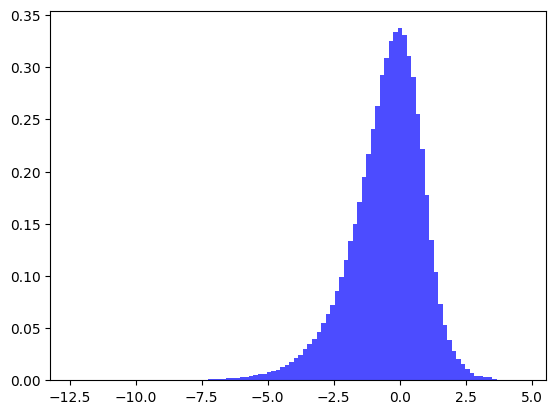

In [241]:
plt.hist(pow_norm.ravel(), bins=100, density=True, color='blue', alpha=0.7);

In [243]:
%cd OPM-MEG/

/content/drive/MyDrive/OPM-MEG


In [18]:
from src.tools.rankselection import rank_selection, r_squared,  run_parafac

In [181]:
def load_aal3_labels(txt_path, n_rois=None):
    """
    Load AAL3 atlas labels from text file.

    Parameters:
        txt_path : str
            Path to label file
        n_rois : int, optional
            If provided, only return first n_rois labels (to match tensor size)

    Returns:
        labels : list of str
    """
    labels = []

    with open(txt_path, 'r') as f:
        for line in f:
            line = line.strip()
            if not line:
                continue

            parts = line.split()
            if len(parts) >= 2:
                labels.append(parts[1])

    # Truncate if needed
    if n_rois is not None:
        if n_rois < len(labels):
            print(f"Truncating labels from {len(labels)} to {n_rois}")
            print(f"Excluded ROIs: {labels[n_rois:]}")
            labels = labels[:n_rois]

    print(f"Loaded {len(labels)} AAL2 labels")
    return labels

aal2_full = load_aal3_labels('aal2.nii.txt')



print(len(aal2_full))


Loaded 120 AAL2 labels
120


In [361]:
# Check shape
print(f"tensor_norm shape: {pow_norm.shape}")
print(f"Number of ROI labels: {len(aal2_full)}")

# Define patterns to KEEP
keep_patterns = [ 'amy','hipp','acc','tempor','insula','ofc','frontal']

# Find indices to keep
keep_idx = [i for i, name in enumerate(aal2_full)
            if any(pattern in name.lower() for pattern in keep_patterns)]

# Filter tensor [roi x freq x time] on axis 0
pow_norm_filtered = pow_norm[keep_idx, :, :]
labels_filtered = [aal2_full[i] for i in keep_idx]

print(f"Kept {len(keep_idx)} / {len(aal2_full)} ROIs")
print(f"New shape: {pow_norm_filtered.shape}")
print(f"ROIs kept: {labels_filtered}")

tensor_norm shape: (120, 42, 81)
Number of ROI labels: 120
Kept 40 / 120 ROIs
New shape: (40, 42, 81)
ROIs kept: ['Frontal_Sup_2_L', 'Frontal_Sup_2_R', 'Frontal_Mid_2_L', 'Frontal_Mid_2_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Inf_Orb_2_L', 'Frontal_Inf_Orb_2_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'OFCmed_L', 'OFCmed_R', 'OFCant_L', 'OFCant_R', 'OFCpost_L', 'OFCpost_R', 'OFClat_L', 'OFClat_R', 'Insula_L', 'Insula_R', 'Hippocampus_L', 'Hippocampus_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Amygdala_L', 'Amygdala_R', 'Temporal_Sup_L', 'Temporal_Sup_R', 'Temporal_Pole_Sup_L', 'Temporal_Pole_Sup_R', 'Temporal_Mid_L', 'Temporal_Mid_R', 'Temporal_Pole_Mid_L', 'Temporal_Pole_Mid_R', 'Temporal_Inf_L', 'Temporal_Inf_R']


In [362]:
pow_norm_filtered.shape

(40, 42, 81)

In [354]:
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
from nilearn import plotting
from matplotlib.gridspec import GridSpec

def to_numpy(x):
    """Safely converts PyTorch Tensors to NumPy arrays."""
    if hasattr(x, "detach"):
        return x.detach().cpu().numpy()
    elif hasattr(x, "numpy"):
        return x.numpy()
    return np.array(x)

def plot_factors_on_atlas_ers_erd(
    factors,
    roi_labels, full_atlas_labels, aal_nifti_path,
    freq_vec=None, time_vec=None,
    top_n_rois=10,
    threshold_percentile=75,
    plot_type='ERS',  # 'ERS' or 'ERD'
    time_in_seconds=True,
):
    """
    Plots CP factors using Nilearn with ERS/ERD specific logic.
    ERS uses Red themes; ERD uses Blue themes.
    """
    # Extract A, B, C from the Parafac object
    A = to_numpy(factors.factors[0])
    B = to_numpy(factors.factors[1])
    C = to_numpy(factors.factors[2])

    aal_img = nib.load(aal_nifti_path)
    aal_data = aal_img.get_fdata()
    affine = aal_img.affine

    R = A.shape[1]

    # Define theme colours based on input
    main_color = 'red' if plot_type == 'ERS' else 'blue'
    cmap = 'Reds' if plot_type == 'ERS' else 'Blues'

    if freq_vec is None:
        freq_vec = np.linspace(0, 45, B.shape[0])
    else:
        freq_vec = to_numpy(freq_vec)

    if time_vec is None:
        time_vec = np.linspace(0, 1000, C.shape[0])
    else:
        time_vec = to_numpy(time_vec)
        if time_in_seconds:
            time_vec *= 1000

    for r in range(R):
        fig = plt.figure(figsize=(18, 8))
        gs = GridSpec(
            2, 4, figure=fig,
            height_ratios=[1, 0.8],
            width_ratios=[1.2, 1, 1, 1],
            hspace=0.3, wspace=0.3,
        )

        title_color = 'red' if plot_type == 'ERS' else 'blue'
        fig.suptitle(f"{plot_type} Component {r+1}", fontsize=16, fontweight="bold", color=title_color)

        # Spatial Factor (A)
        roi_weights = np.nan_to_num(A[:, r].copy(), nan=0.0)

        # In your first code, you used absolute values for ERD plotting
        # We'll use absolute weights for the brain mapping to show magnitude of change
        abs_weights = np.abs(roi_weights)
        max_abs = np.max(abs_weights)
        roi_weights_norm = abs_weights / max_abs if max_abs > 0 else abs_weights

        brain_vol = np.zeros(aal_data.shape, dtype=float)
        for i, roi_name in enumerate(roi_labels):
            try:
                atlas_idx = full_atlas_labels.index(roi_name)
                brain_vol[aal_data == atlas_idx + 1] = roi_weights_norm[i]
            except ValueError:
                pass

        weight_nii = nib.Nifti1Image(brain_vol, affine)
        nonzero = roi_weights_norm[roi_weights_norm != 0]
        threshold = np.percentile(nonzero, threshold_percentile) if len(nonzero) > 0 else 0.01

        # --- GLASS BRAIN ---
        ax_glass = fig.add_subplot(gs[0, 0])
        plotting.plot_glass_brain(
            weight_nii,
            axes=ax_glass,
            display_mode="lyrz",
            threshold=threshold,
            colorbar=True,
            plot_abs=True,
            vmax=1.0,
            cmap=cmap,
            alpha=0.8,
        )
        ax_glass.set_title(f"Glass Brain ({plot_type})")

        # --- AXIAL SLICES ---
        ax_stat = fig.add_subplot(gs[0, 1:])
        plotting.plot_stat_map(
            weight_nii,
            axes=ax_stat,
            display_mode="z",
            cut_coords=7,
            threshold=threshold,
            colorbar=True,
            vmax=1.0,
            cmap=cmap,
        )

        # --- TOP ROIs (Bar Chart) ---
        ax_bar = fig.add_subplot(gs[1, 0])
        sorted_idx = np.argsort(abs_weights)[::-1]
        top_idx = sorted_idx[:top_n_rois]
        top_weights = abs_weights[top_idx]
        top_names = [roi_labels[i][:20] for i in top_idx]

        y_pos = np.arange(len(top_weights))
        ax_bar.barh(y_pos, top_weights, color=main_color, alpha=0.7, edgecolor="black")
        ax_bar.set_yticks(y_pos)
        ax_bar.set_yticklabels(top_names, fontsize=9)
        ax_bar.set_title(f"Top {top_n_rois} {plot_type} ROIs")
        ax_bar.invert_yaxis()

        # --- FREQUENCY (Spectral Factor B) ---
        ax_freq = fig.add_subplot(gs[1, 1:3])
        freq_weights = np.abs(B[:, r])
        ax_freq.fill_between(freq_vec, freq_weights, alpha=0.3, color=main_color)
        ax_freq.plot(freq_vec, freq_weights, linewidth=2, color=main_color)
        ax_freq.set_title(f"{plot_type} Frequency Profile")
        ax_freq.set_xlabel("Frequency (Hz)")

        # --- TIME (Temporal Factor C) ---
        ax_time = fig.add_subplot(gs[1, 3])
        time_weights = np.abs(C[:, r])
        ax_time.fill_between(time_vec, time_weights, alpha=0.3, color=main_color)
        ax_time.plot(time_vec, time_weights, linewidth=1.5, color=main_color)
        ax_time.set_title(f"{plot_type} Temporal Profile")
        ax_time.set_xlabel("Time (ms)")

        plt.tight_layout()
        plt.show()

ERS (positive) range: [0.00, 4.62]
ERD (negative) range: [0.00, 11.02]


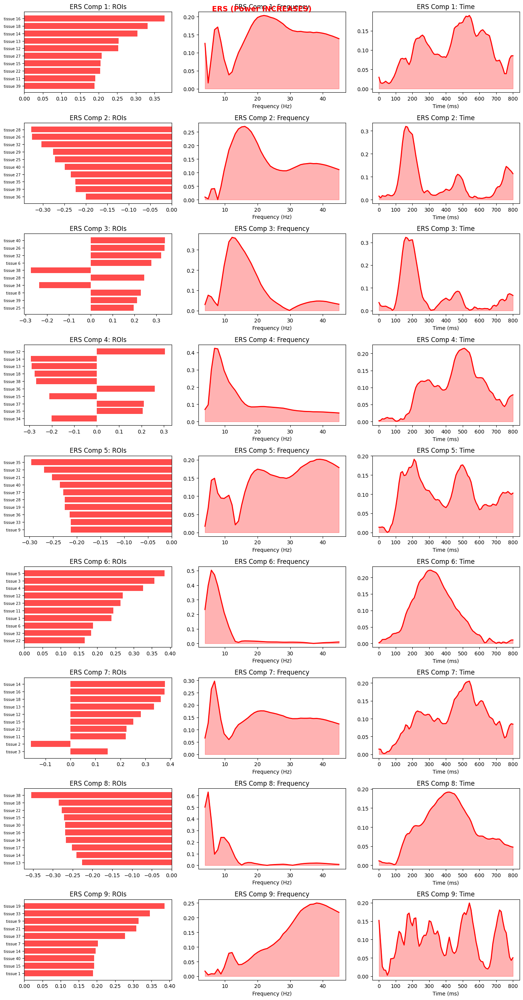

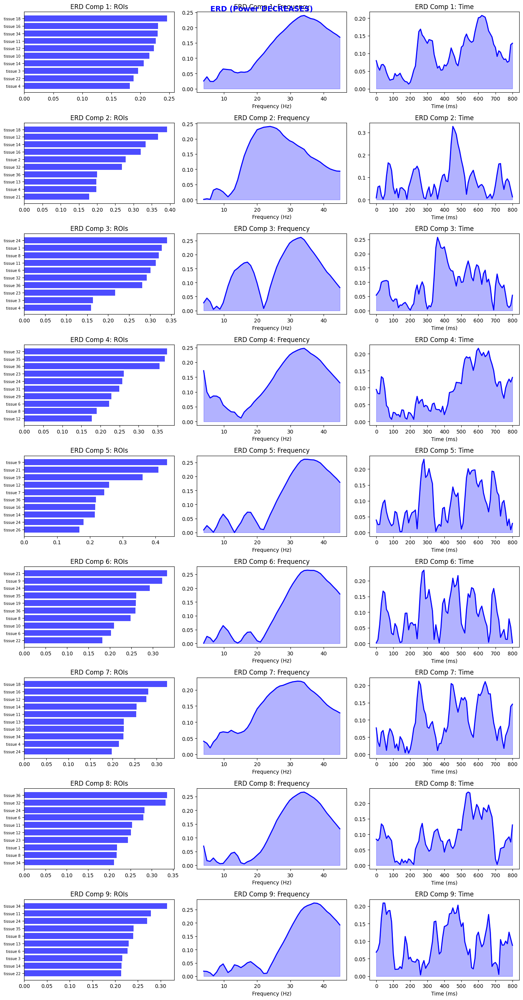

In [363]:
import numpy as np
import tensorly as tl
from tensorly.decomposition import parafac
import matplotlib.pyplot as plt

tl.set_backend('numpy')

# Split into positive (ERS) and negative (ERD) power changes
pow_positive = np.maximum(pow_norm_filtered, 0)  # ERS only
pow_negative = np.abs(np.minimum(pow_norm_filtered, 0))  # ERD only (make positive)

print(f"ERS (positive) range: [{pow_positive.min():.2f}, {pow_positive.max():.2f}]")
print(f"ERD (negative) range: [{pow_negative.min():.2f}, {pow_negative.max():.2f}]")

# === CP on ERS (power increases) ===
pow_ers = np.nan_to_num(pow_positive, nan=0.0)
pow_ers = np.ascontiguousarray(pow_ers, dtype=np.float64)

rank = 9
factors_ers = parafac(pow_ers, rank=rank, n_iter_max=500, init='svd', random_state=42,normalize_factors=True)


A_ers = np.array(factors_ers.factors[0])
B_ers = np.array(factors_ers.factors[1])
C_ers = np.array(factors_ers.factors[2])

# === CP on ERD (power decreases) ===
pow_erd = np.nan_to_num(pow_negative, nan=0.0)
pow_erd = np.ascontiguousarray(pow_erd, dtype=np.float64)

factors_erd = parafac(pow_erd, rank=rank, n_iter_max=500, init='svd', random_state=42,normalize_factors=True)

A_erd = np.array(factors_erd.factors[0])
B_erd = np.array(factors_erd.factors[1])
C_erd = np.array(factors_erd.factors[2])

# === Plot ERS Components ===
fig, axes = plt.subplots(rank, 3, figsize=(14, 3*rank))
fig.suptitle('ERS (Power INCREASES)', fontsize=14, fontweight='bold', color='red')

for i in range(rank):
    top_idx = np.argsort(np.abs(A_ers[:, i]))[-10:]
    axes[i, 0].barh(range(10), A_ers[top_idx, i], color='red', alpha=0.7)
    axes[i, 0].set_yticks(range(10))
    axes[i, 0].set_yticklabels([roi_labels[j][:15] for j in top_idx], fontsize=7)
    axes[i, 0].set_title(f'ERS Comp {i+1}: ROIs')

    axes[i, 1].plot(freq_vec, np.abs(B_ers[:, i]), 'r-', linewidth=2)
    axes[i, 1].fill_between(freq_vec, 0, np.abs(B_ers[:, i]), alpha=0.3, color='red')
    axes[i, 1].set_xlabel('Frequency (Hz)')
    axes[i, 1].set_title(f'ERS Comp {i+1}: Frequency')

    axes[i, 2].plot(time_vec * 1000, np.abs(C_ers[:, i]), 'r-', linewidth=2)
    axes[i, 2].fill_between(time_vec * 1000, 0, np.abs(C_ers[:, i]), alpha=0.3, color='red')
    axes[i, 2].set_xlabel('Time (ms)')
    axes[i, 2].set_title(f'ERS Comp {i+1}: Time')

plt.tight_layout()
plt.show()

# === Plot ERD Components ===
fig, axes = plt.subplots(rank, 3, figsize=(14, 3*rank))
fig.suptitle('ERD (Power DECREASES)', fontsize=14, fontweight='bold', color='blue')

for i in range(rank):
    top_idx = np.argsort(np.abs(A_erd[:, i]))[-10:]
    axes[i, 0].barh(range(10), np.abs(A_erd[top_idx, i]), color='blue', alpha=0.7)
    axes[i, 0].set_yticks(range(10))
    axes[i, 0].set_yticklabels([roi_labels[j][:15] for j in top_idx], fontsize=7)
    axes[i, 0].set_title(f'ERD Comp {i+1}: ROIs')

    axes[i, 1].plot(freq_vec, np.abs(B_erd[:, i]), 'b-', linewidth=2)
    axes[i, 1].fill_between(freq_vec, 0, np.abs(B_erd[:, i]), alpha=0.3, color='blue')
    axes[i, 1].set_xlabel('Frequency (Hz)')
    axes[i, 1].set_title(f'ERD Comp {i+1}: Frequency')

    axes[i, 2].plot(time_vec * 1000, np.abs(C_erd[:, i]), 'b-', linewidth=2)
    axes[i, 2].fill_between(time_vec * 1000, 0, np.abs(C_erd[:, i]), alpha=0.3, color='blue')
    axes[i, 2].set_xlabel('Time (ms)')
    axes[i, 2].set_title(f'ERD Comp {i+1}: Time')

plt.tight_layout()
plt.show()

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


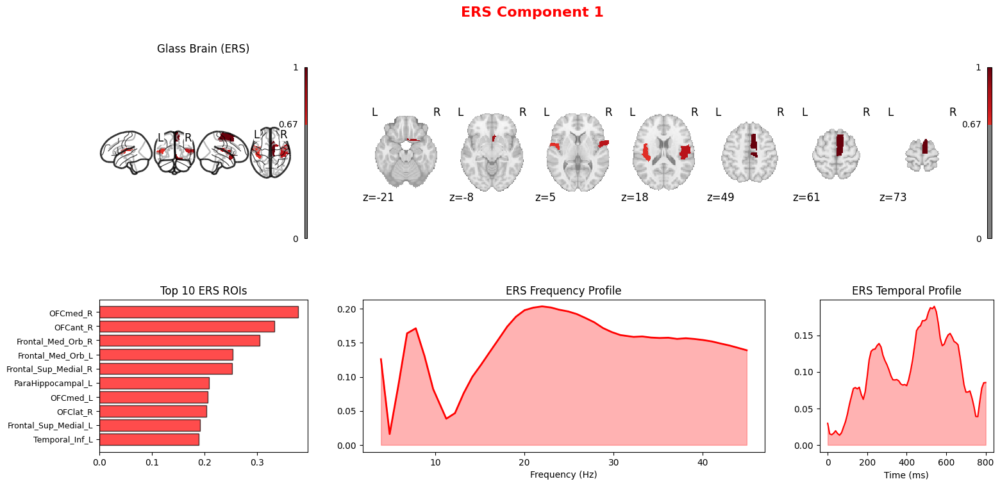

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


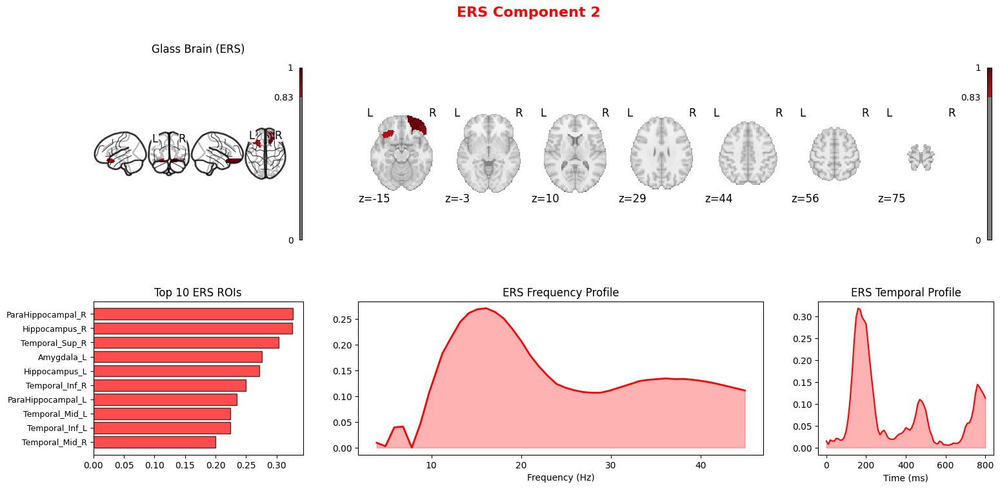

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


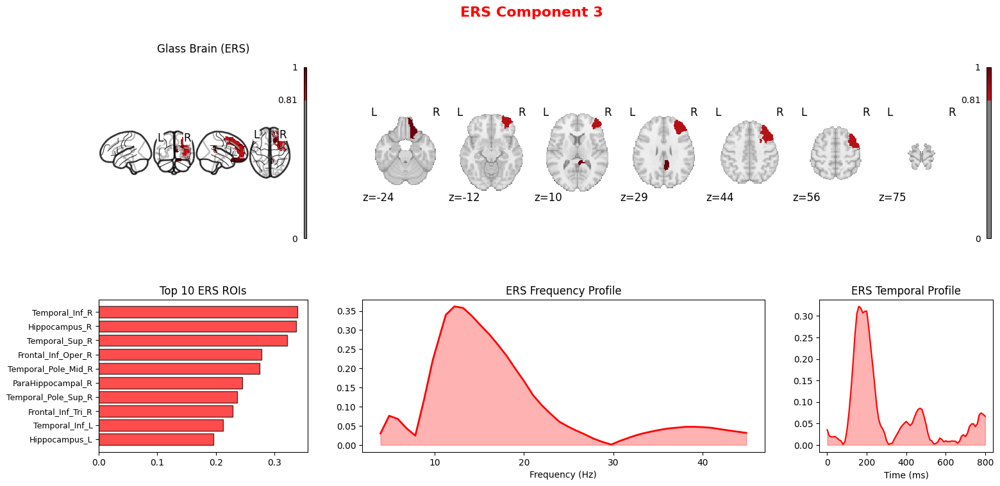

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


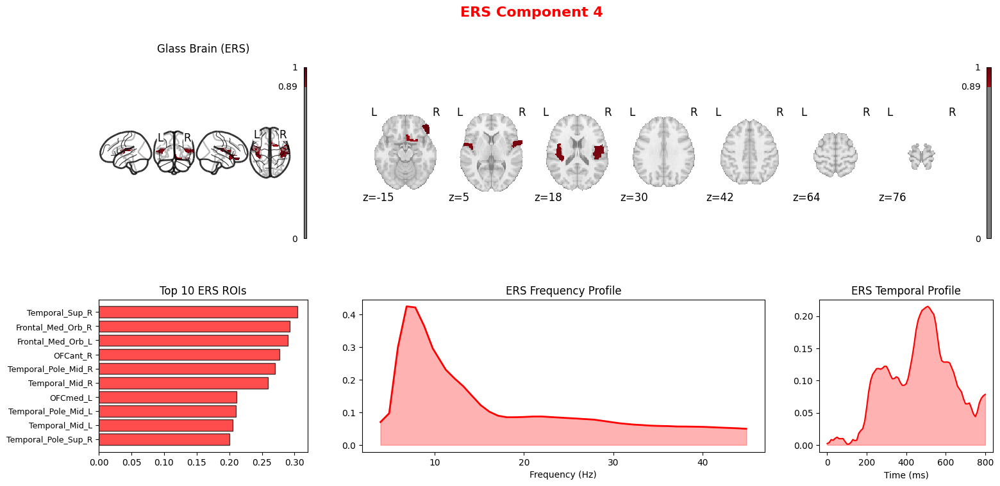

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


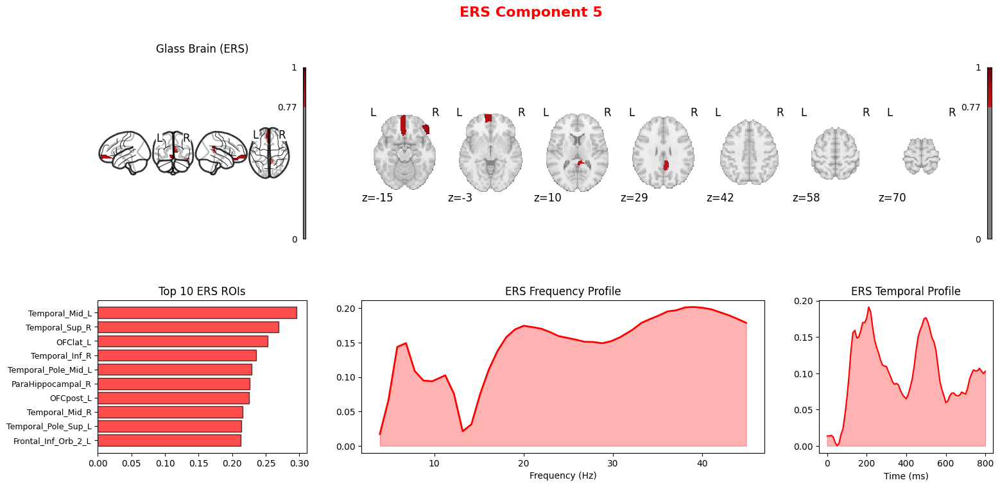

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


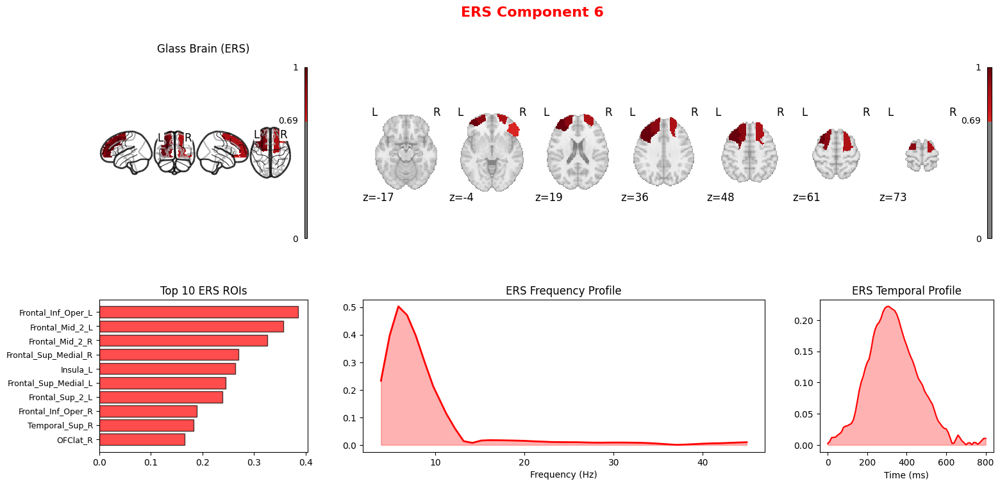

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


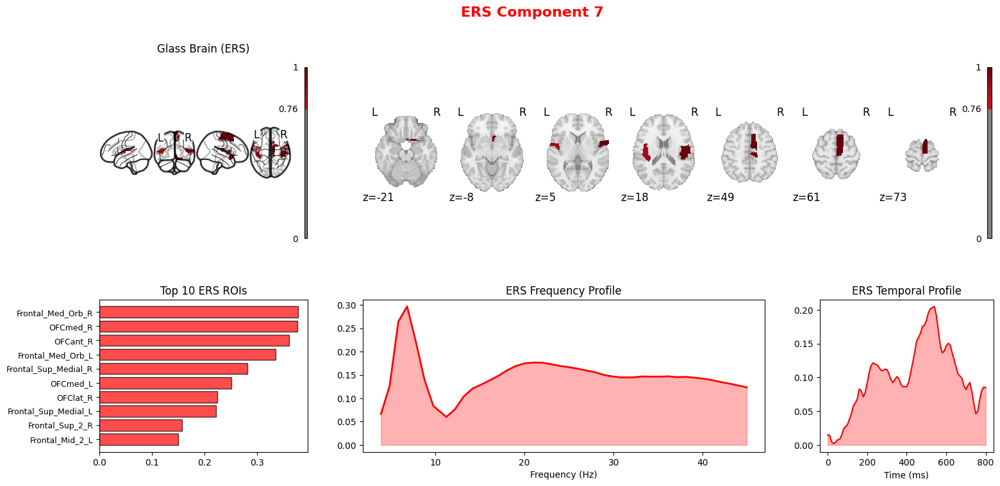

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


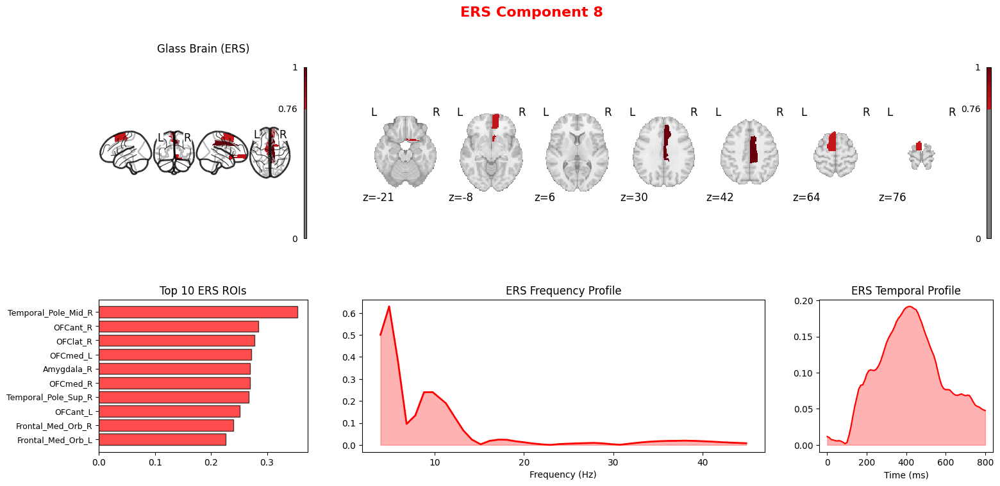

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


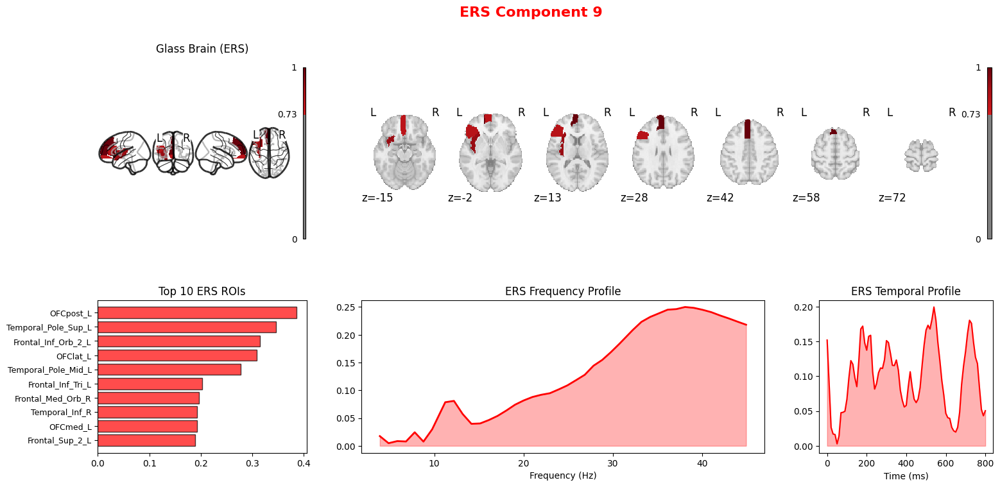

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


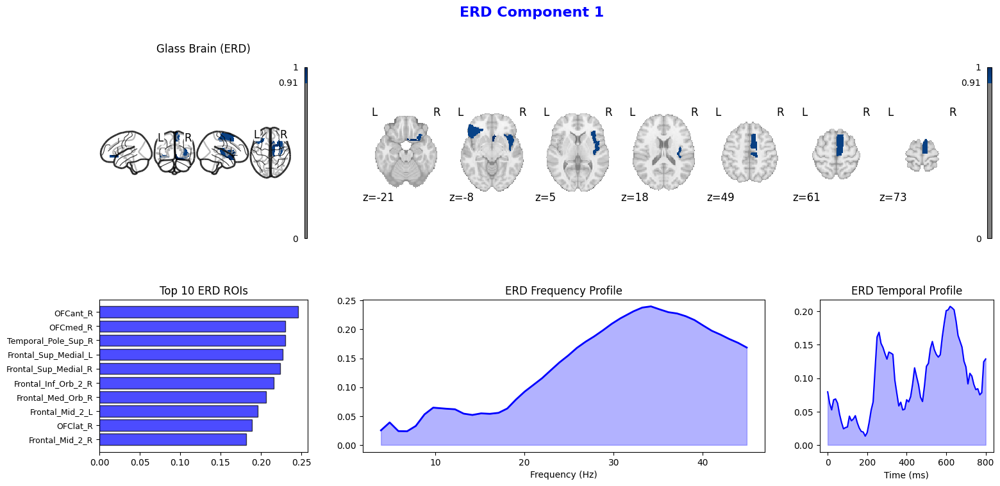

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


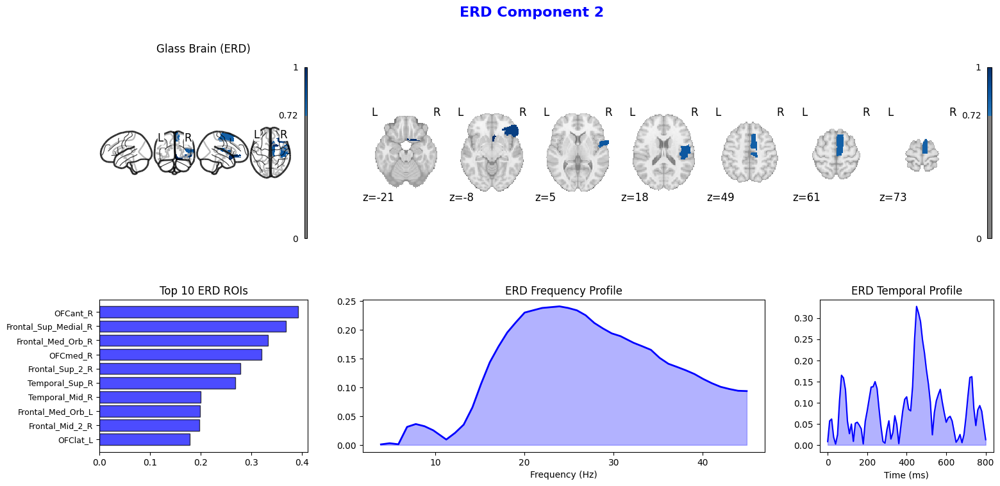

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


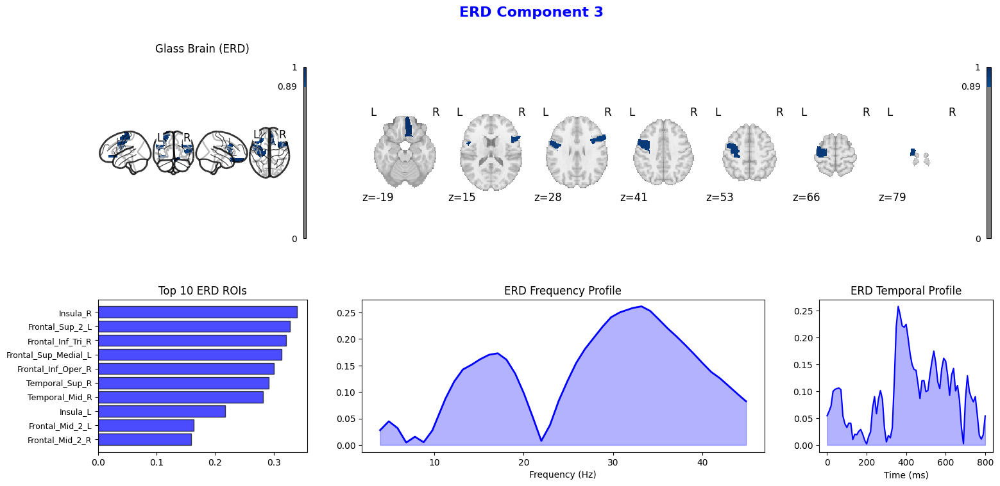

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


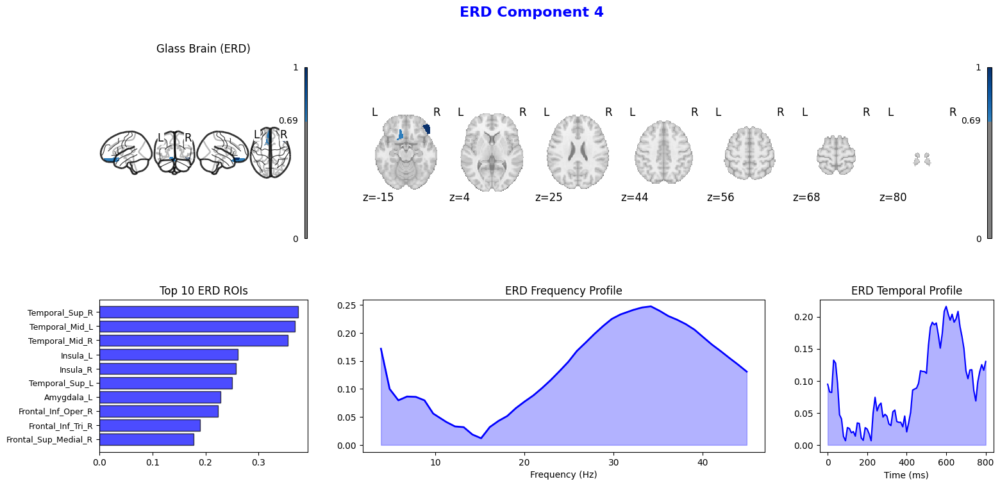

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


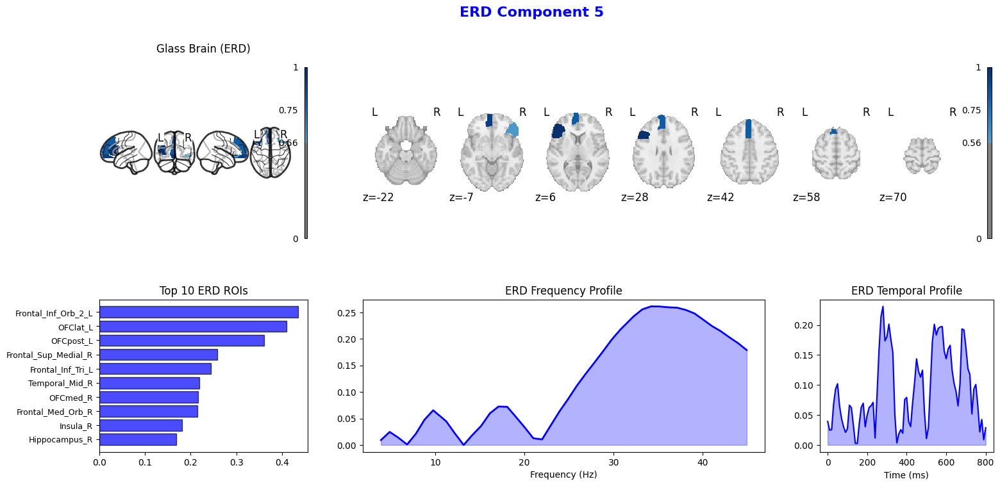

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


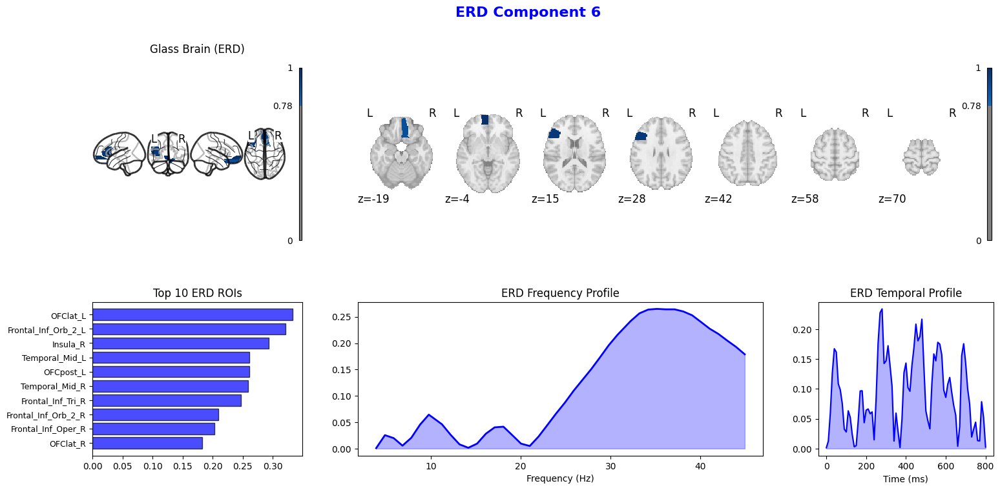

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


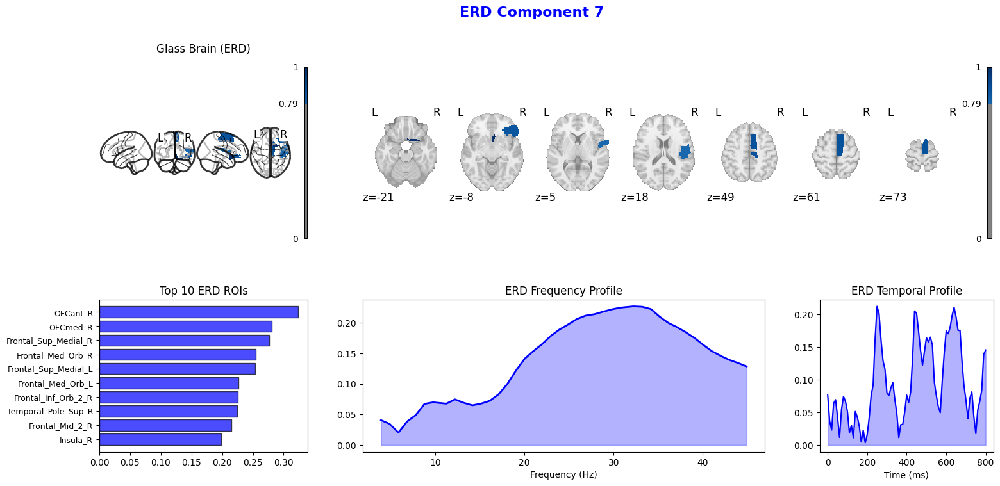

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


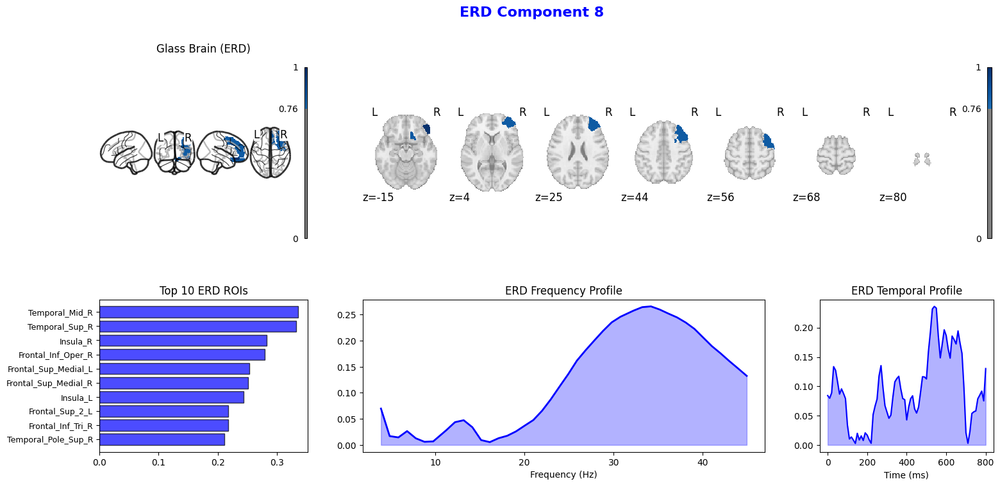

/tmp/ipython-input-3752764929.py:146: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


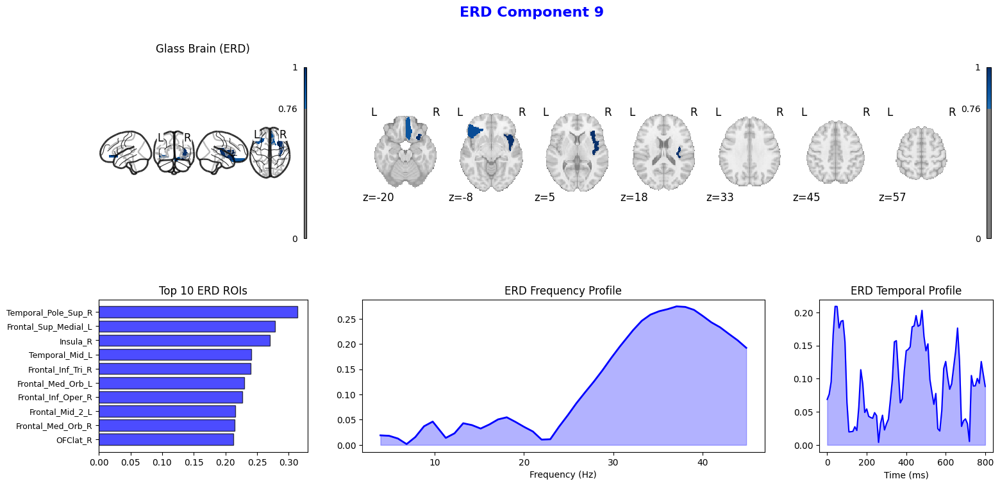

In [364]:
# For ERS
plot_factors_on_atlas_ers_erd(factors_ers, labels_filtered, labels_filtered,
                              aal_nifti_path, freq_vec, time_vec, plot_type='ERS', threshold_percentile=90)

# For ERD
plot_factors_on_atlas_ers_erd(factors_erd, labels_filtered, labels_filtered,
                              aal_nifti_path, freq_vec, time_vec, plot_type='ERD', threshold_percentile=90)

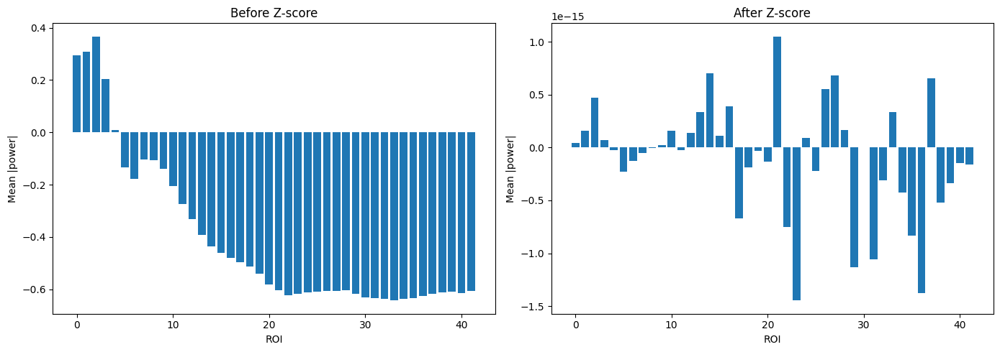

In [340]:
# Numpy
mean = pow_norm_filtered.mean(axis=(0, 2), keepdims=True)
std = pow_norm_filtered.std(axis=(0, 2), keepdims=True)
tensor_norm = (pow_norm_filtered - mean) / (std)

# Power distribution per ROI
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Before
roi_power_before = (pow_norm_filtered).mean(axis=(0,2))
axes[0].bar(range(len(roi_power_before)), roi_power_before)
axes[0].set_xlabel('ROI')
axes[0].set_ylabel('Mean |power|')
axes[0].set_title('Before Z-score')

# After
roi_power_after = (tensor_norm).mean(axis=(0, 2))
axes[1].bar(range(len(roi_power_after)), roi_power_after)
axes[1].set_xlabel('ROI')
axes[1].set_ylabel('Mean |power|')
axes[1].set_title('After Z-score')

plt.tight_layout()
plt.show()

In [327]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
log_pow_torch = torch.as_tensor(tensor_norm, device=device, dtype=torch.float32)
log_pow_torch.shape[0]

26

In [153]:
results = rank_selection(log_pow_torch, ranks=range(1, 16), n_repeats=30)


=== Rank 1 ===
--- Testing Rank 1 with 30 repeats ---
  30/30 models within 1.05x of best error
Rank 1: Best Error=0.9343 | Mean Stability=1.0000
Rank 1: Stability=1.000±0.000, R²=0.127±0.000

=== Rank 2 ===
--- Testing Rank 2 with 30 repeats ---
  30/30 models within 1.05x of best error
Rank 2: Best Error=0.8993 | Mean Stability=0.7941
Rank 2: Stability=0.794±0.063, R²=0.191±0.000

=== Rank 3 ===
--- Testing Rank 3 with 30 repeats ---
  30/30 models within 1.05x of best error
Rank 3: Best Error=0.8724 | Mean Stability=0.3872
Rank 3: Stability=0.387±0.348, R²=0.239±0.002

=== Rank 4 ===
--- Testing Rank 4 with 30 repeats ---


KeyboardInterrupt: 

In [109]:
stabilities = results['stabilities']
stds = results['stab_stds']

ranks = results['ranks']
r2_scores = results['r2_scores']
r2_stds = results['r2_stds']

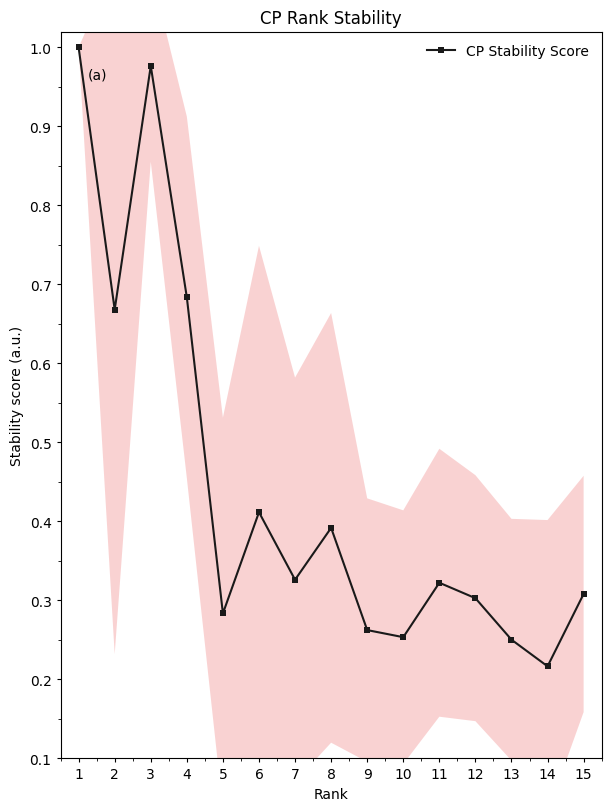

In [110]:
from matplotlib.ticker import MultipleLocator, AutoMinorLocator

fig, ax = plt.subplots(
    figsize=(6, 8),
    constrained_layout=True
)

def panel(a, y, yerr, title, panel_label):
    # Uncertainty as a band
    a.fill_between(
        ranks, y - yerr, y + yerr,
        color="lightcoral", alpha=0.35, linewidth=0, zorder=1
    )

    # Mean line + markers
    a.plot(
        ranks, y, "s-",
        color="0.1",
        markersize=4,
        markerfacecolor="0.1",
        markeredgewidth=0,
        zorder=2,
        label="CP Stability Score"
    )

    # Reference line
   # a.axhline(0.6, color="0.5", ls="--", lw=0.8, zorder=0)

    # Axes formatting
    a.set_title(title)
    a.set_xlim(0.5, max(ranks) + 0.5)
    a.set_xticks(ranks)
    a.tick_params(direction="out", length=3, width=0.8)
    a.tick_params(which="minor", direction="out", length=2, width=0.6)

    # Minor ticks without clutter
    a.xaxis.set_minor_locator(AutoMinorLocator(2))
    a.yaxis.set_minor_locator(AutoMinorLocator(2))
    a.yaxis.set_major_locator(MultipleLocator(0.1))

    # Panel label
    a.text(0.05, 0.95, panel_label, transform=a.transAxes,
           va="top", ha="left")

panel(ax, np.asarray(stabilities), np.asarray(stds),
      "CP Rank Stability", "(a)")

ax.set_ylabel("Stability score (a.u.)")
ax.set_xlabel("Rank")
ax.set_ylim(0.1, 1.02)

# Legend
ax.legend(loc="upper right", frameon=False)

plt.show()

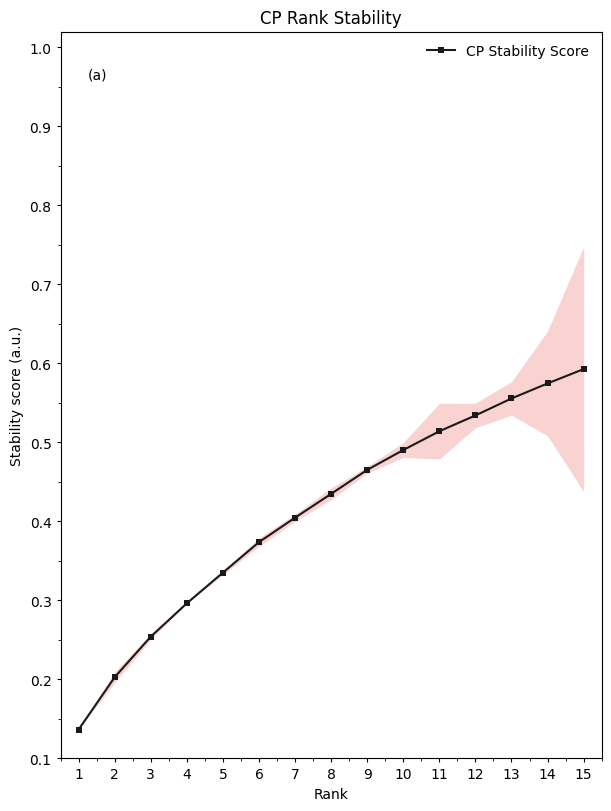

In [111]:
from matplotlib.ticker import MultipleLocator, AutoMinorLocator

fig, ax = plt.subplots(
    figsize=(6, 8),
    constrained_layout=True
)

def panel(a, y, yerr, title, panel_label):
    # Uncertainty as a band
    a.fill_between(
        ranks, y - yerr, y + yerr,
        color="lightcoral", alpha=0.35, linewidth=0, zorder=1
    )

    # Mean line + markers
    a.plot(
        ranks, y, "s-",
        color="0.1",
        markersize=4,
        markerfacecolor="0.1",
        markeredgewidth=0,
        zorder=2,
        label="CP Stability Score"
    )

    # Reference line
   # a.axhline(0.6, color="0.5", ls="--", lw=0.8, zorder=0)

    # Axes formatting
    a.set_title(title)
    a.set_xlim(0.5, max(ranks) + 0.5)
    a.set_xticks(ranks)
    a.tick_params(direction="out", length=3, width=0.8)
    a.tick_params(which="minor", direction="out", length=2, width=0.6)

    # Minor ticks without clutter
    a.xaxis.set_minor_locator(AutoMinorLocator(2))
    a.yaxis.set_minor_locator(AutoMinorLocator(2))
    a.yaxis.set_major_locator(MultipleLocator(0.1))

    # Panel label
    a.text(0.05, 0.95, panel_label, transform=a.transAxes,
           va="top", ha="left")

panel(ax, np.asarray(r2_scores), np.asarray(r2_stds),
      "CP Rank Stability", "(a)")

ax.set_ylabel("Stability score (a.u.)")
ax.set_xlabel("Rank")
ax.set_ylim(0.1, 1.02)

# Legend
ax.legend(loc="upper right", frameon=False)

plt.show()

In [ ]:
from tensorly.cp_tensor import cp_normalize
from tensorly.decomposition import parafac
import tensorly as tl
tl.set_backend('pytorch')

In [22]:
%cd ..

/content/drive/MyDrive/OPM-MEG


In [23]:
aal_nifti_path = 'AAL3v1_1mm.nii'

In [328]:
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
from nilearn import plotting
from matplotlib.gridspec import GridSpec


def to_numpy(x):
    """Safely converts PyTorch Tensors to NumPy arrays."""
    if hasattr(x, "detach"):
        return x.detach().cpu().numpy()
    elif hasattr(x, "numpy"):
        return x.numpy()
    return np.array(x)


def plot_factors_on_atlas(
    A, B, C,
    roi_labels, full_atlas_labels, aal_nifti_path,
    freq_vec=None, time_vec=None,
    top_n_rois=10,
    threshold_percentile=75,
    global_normalize=False,
    time_in_seconds=True,
):
    """
    Plot CP factors for baseline-normalized (signed) data.
    Red = positive weights, Blue = negative weights.
    """
    A = to_numpy(A)
    B = to_numpy(B)
    C = to_numpy(C)

    aal_img = nib.load(aal_nifti_path)
    aal_data = aal_img.get_fdata()
    affine = aal_img.affine

    R = A.shape[1]
    global_max = np.max(np.abs(A)) if global_normalize else None

    if freq_vec is None:
        freq_vec = np.linspace(0, 45, B.shape[0])
    else:
        freq_vec = to_numpy(freq_vec)

    if time_vec is None:
        time_vec = np.linspace(0, 1000, C.shape[0])
    else:
        time_vec = to_numpy(time_vec)
        if time_in_seconds:
            time_vec *= 1000

    for r in range(R):
        fig = plt.figure(figsize=(18, 8))
        gs = GridSpec(
            2, 4, figure=fig,
            height_ratios=[1, 0.8],
            width_ratios=[1.2, 1, 1, 1],
            hspace=0.3, wspace=0.3,
        )
        fig.suptitle(f"Component {r+1}", fontsize=16, fontweight="bold")

        roi_weights = np.nan_to_num(A[:, r].copy(), nan=0.0)

        if global_normalize and global_max > 0:
            roi_weights_norm = roi_weights / global_max
        else:
            max_abs = np.max(np.abs(roi_weights))
            roi_weights_norm = roi_weights / max_abs if max_abs > 0 else roi_weights

        brain_vol = np.zeros(aal_data.shape, dtype=float)
        for i, roi_name in enumerate(roi_labels):
            try:
                atlas_idx = full_atlas_labels.index(roi_name)
                brain_vol[aal_data == atlas_idx + 1] = roi_weights_norm[i]
            except ValueError:
                pass

        weight_nii = nib.Nifti1Image(brain_vol, affine)

        nonzero = np.abs(roi_weights_norm[roi_weights_norm != 0])
        threshold = (
            np.percentile(nonzero, threshold_percentile)
            if len(nonzero) > 0 else 0.01
        )

        # --- GLASS BRAIN ---
        ax_glass = fig.add_subplot(gs[0, 0])
        plotting.plot_glass_brain(
            weight_nii,
            axes=ax_glass,
            display_mode="lyrz",
            threshold=threshold,
            colorbar=True,
            plot_abs=False,
            vmax=1.0, vmin=-1.0,
            symmetric_cbar=True,
            cmap="RdBu_r",
            alpha=0.8,
        )
        ax_glass.set_title(
            f"Glass Brain (thresh: {threshold_percentile}th %ile)"
        )

        # --- AXIAL SLICES ---
        ax_stat = fig.add_subplot(gs[0, 1:])
        plotting.plot_stat_map(
            weight_nii,
            axes=ax_stat,
            display_mode="z",
            cut_coords=7,
            threshold=threshold,
            colorbar=True,
            vmax=1.0, vmin=-1.0,
            symmetric_cbar=True,
            cmap="RdBu_r",
        )

        # --- TOP ROIs ---
        ax_bar = fig.add_subplot(gs[1, 0])
        sorted_idx = np.argsort(np.abs(roi_weights))[::-1]
        top_idx = sorted_idx[:top_n_rois]
        top_weights = roi_weights[top_idx]
        top_names = [roi_labels[i][:20] for i in top_idx]
        colors = ["#d73027" if w > 0 else "#4575b4" for w in top_weights]

        y_pos = np.arange(len(top_weights))
        ax_bar.barh(
            y_pos, top_weights,
            color=colors, alpha=0.8, edgecolor="black"
        )
        ax_bar.set_yticks(y_pos)
        ax_bar.set_yticklabels(top_names, fontsize=9)
        ax_bar.axvline(0, color="black", linewidth=0.8)
        ax_bar.set_title(f"Top {top_n_rois} ROIs")
        ax_bar.set_xlabel("Weight")
        ax_bar.invert_yaxis()
        ax_bar.grid(True, axis="x", alpha=0.3)

        # --- FREQUENCY ---
        ax_freq = fig.add_subplot(gs[1, 1:3])
        freq_weights = np.abs(B[:, r])
        ax_freq.fill_between(freq_vec, freq_weights, alpha=0.3,color='green')
        ax_freq.plot(freq_vec, freq_weights, linewidth=2,color='green')
        ax_freq.set_ylim(0, freq_weights.max() * 1.1)
        ax_freq.set_title("Frequency Profile")
        ax_freq.set_xlabel("Frequency (Hz)")
        ax_freq.set_ylabel("|Weight| (a.u.)")



        # --- TIME ---
        ax_time = fig.add_subplot(gs[1, 3])
        time_weights = np.abs(C[:, r])
        ax_time.fill_between(time_vec, time_weights, alpha=0.3)
        ax_time.plot(time_vec, time_weights, linewidth=1.5)
        ax_time.set_ylim(0, time_weights.max() * 1.1)
        ax_time.set_title("Temporal Profile")
        ax_time.set_xlabel("Time (ms)")
        ax_time.set_ylabel("|Weight| (a.u,)")


        plt.tight_layout()
        plt.show()

        print(f"\nComponent {r+1} Summary:")
        print(f"  Top 5 ROIs: {[roi_labels[i] for i in sorted_idx[:5]]}")
        print(f"  Peak frequency: {freq_vec[np.argmax(freq_weights)]:.1f} Hz")
        print(f"  Peak time: {time_vec[np.argmax(time_weights)]:.0f} ms")


In [329]:
from tensorly.decomposition import parafac

In [330]:
tl.set_backend('pytorch')

In [331]:
cp_tensor = parafac(log_pow_torch,rank=15, random_state=None, n_iter_max=10000, tol=1e-9, init='svd',normalize_factors=True)

In [332]:
weights,  factors = cp_tensor
A,B,C = factors

/tmp/ipython-input-2403877401.py:163: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


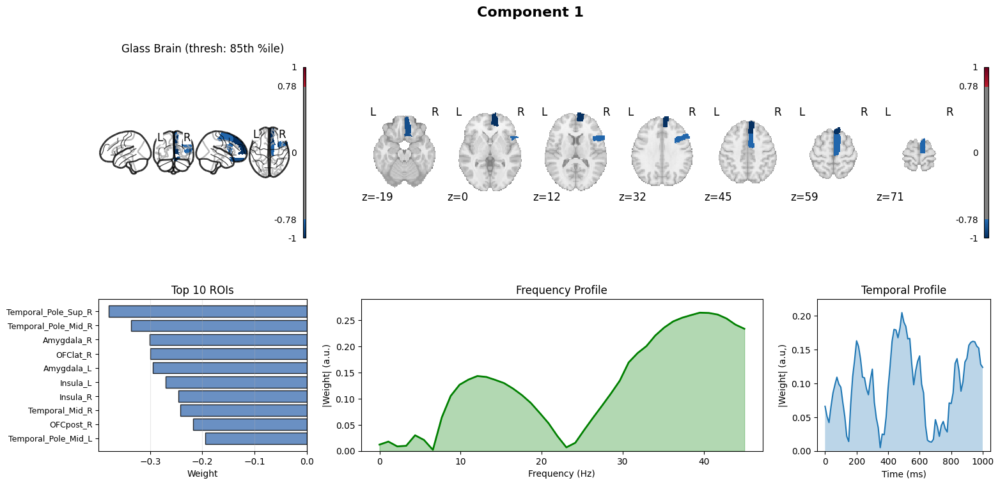


Component 1 Summary:
  Top 5 ROIs: ['Temporal_Pole_Sup_R', 'Temporal_Pole_Mid_R', 'Amygdala_R', 'OFClat_R', 'Amygdala_L']
  Peak frequency: 39.5 Hz
  Peak time: 488 ms


/tmp/ipython-input-2403877401.py:163: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


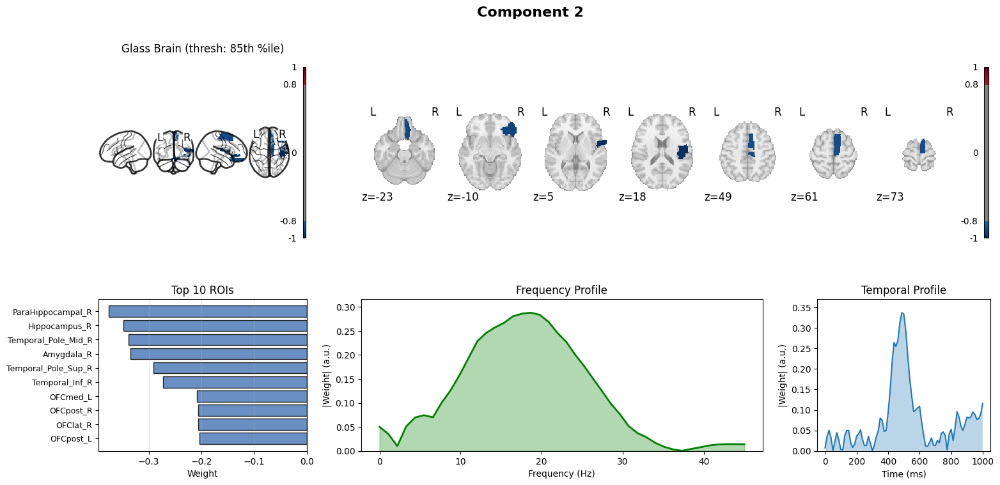


Component 2 Summary:
  Top 5 ROIs: ['ParaHippocampal_R', 'Hippocampus_R', 'Temporal_Pole_Mid_R', 'Amygdala_R', 'Temporal_Pole_Sup_R']
  Peak frequency: 18.7 Hz
  Peak time: 488 ms


/tmp/ipython-input-2403877401.py:163: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


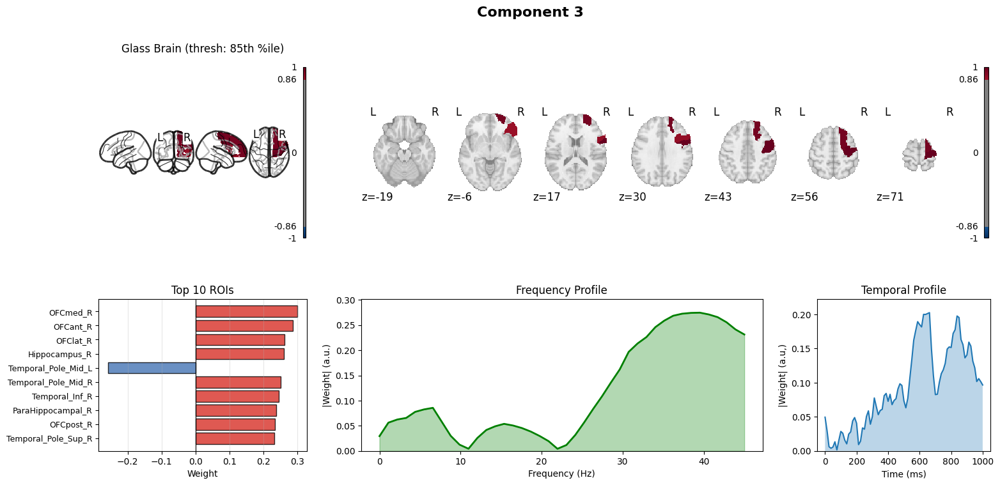


Component 3 Summary:
  Top 5 ROIs: ['OFCmed_R', 'OFCant_R', 'OFClat_R', 'Hippocampus_R', 'Temporal_Pole_Mid_L']
  Peak frequency: 39.5 Hz
  Peak time: 662 ms


/tmp/ipython-input-2403877401.py:163: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


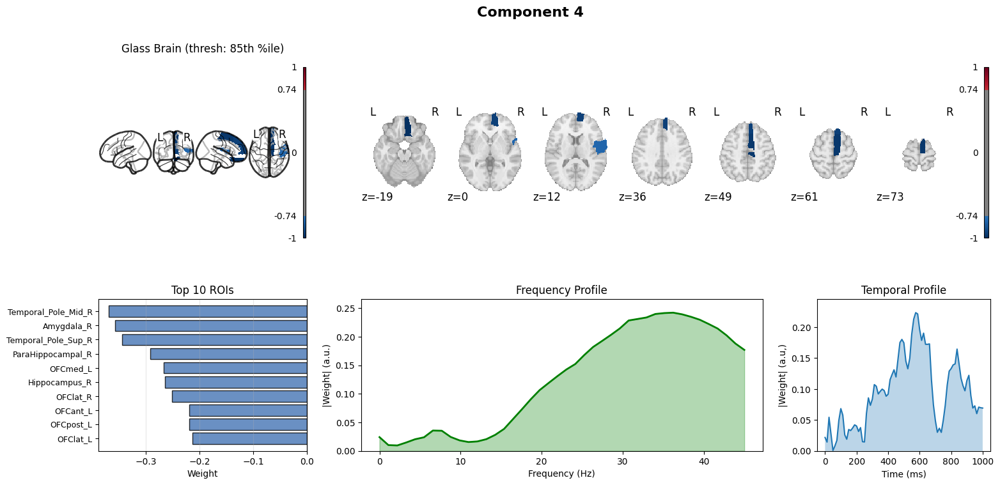


Component 4 Summary:
  Top 5 ROIs: ['Temporal_Pole_Mid_R', 'Amygdala_R', 'Temporal_Pole_Sup_R', 'ParaHippocampal_R', 'OFCmed_L']
  Peak frequency: 36.2 Hz
  Peak time: 575 ms


/tmp/ipython-input-2403877401.py:163: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


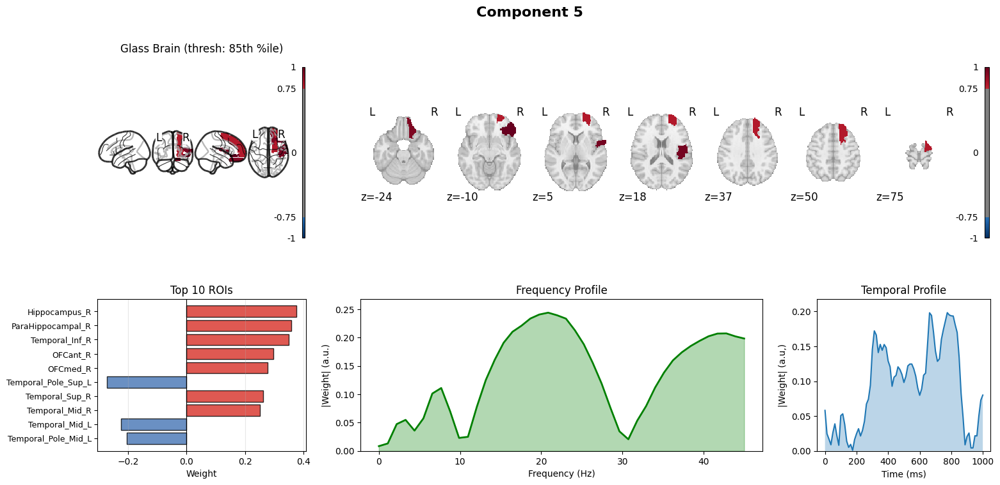


Component 5 Summary:
  Top 5 ROIs: ['Hippocampus_R', 'ParaHippocampal_R', 'Temporal_Inf_R', 'OFCant_R', 'OFCmed_R']
  Peak frequency: 20.9 Hz
  Peak time: 775 ms


/tmp/ipython-input-2403877401.py:163: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


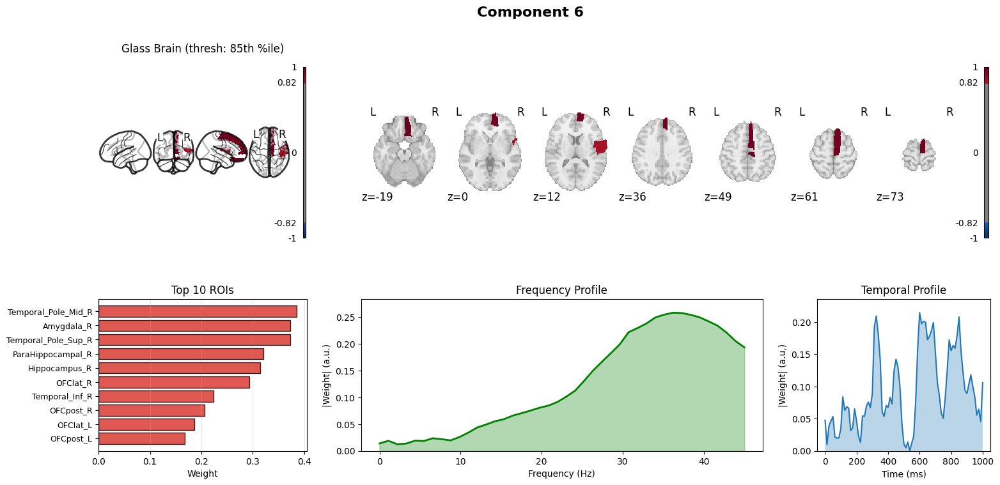


Component 6 Summary:
  Top 5 ROIs: ['Temporal_Pole_Mid_R', 'Amygdala_R', 'Temporal_Pole_Sup_R', 'ParaHippocampal_R', 'Hippocampus_R']
  Peak frequency: 36.2 Hz
  Peak time: 600 ms


/tmp/ipython-input-2403877401.py:163: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


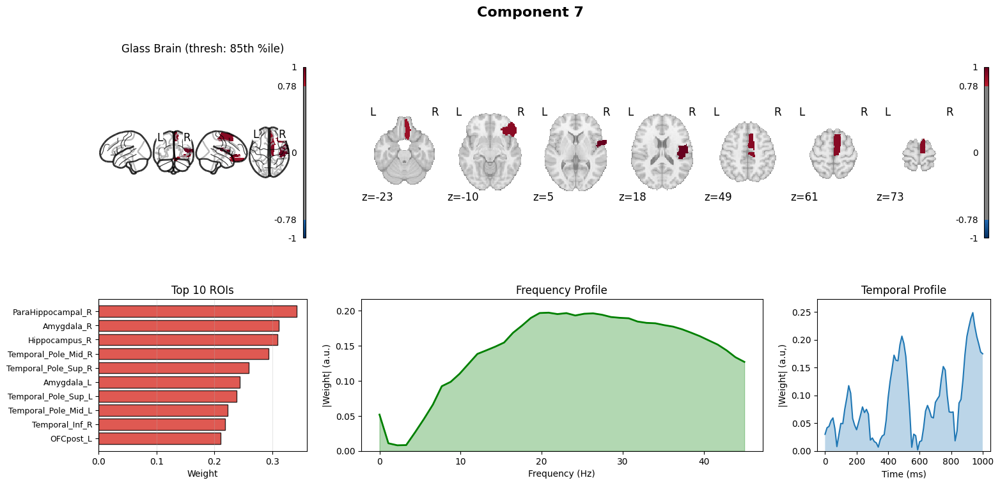


Component 7 Summary:
  Top 5 ROIs: ['ParaHippocampal_R', 'Amygdala_R', 'Hippocampus_R', 'Temporal_Pole_Mid_R', 'Temporal_Pole_Sup_R']
  Peak frequency: 20.9 Hz
  Peak time: 938 ms


/tmp/ipython-input-2403877401.py:163: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


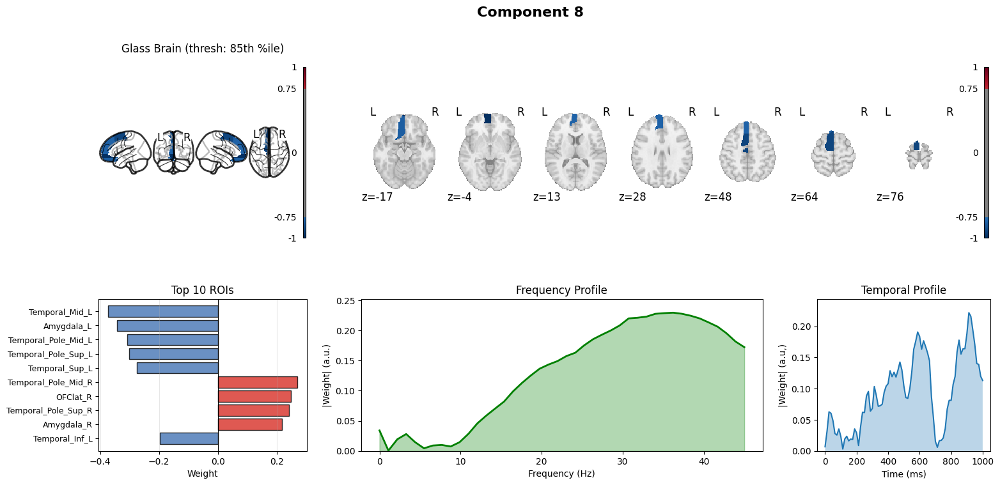


Component 8 Summary:
  Top 5 ROIs: ['Temporal_Mid_L', 'Amygdala_L', 'Temporal_Pole_Mid_L', 'Temporal_Pole_Sup_L', 'Temporal_Sup_L']
  Peak frequency: 36.2 Hz
  Peak time: 912 ms


/tmp/ipython-input-2403877401.py:163: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


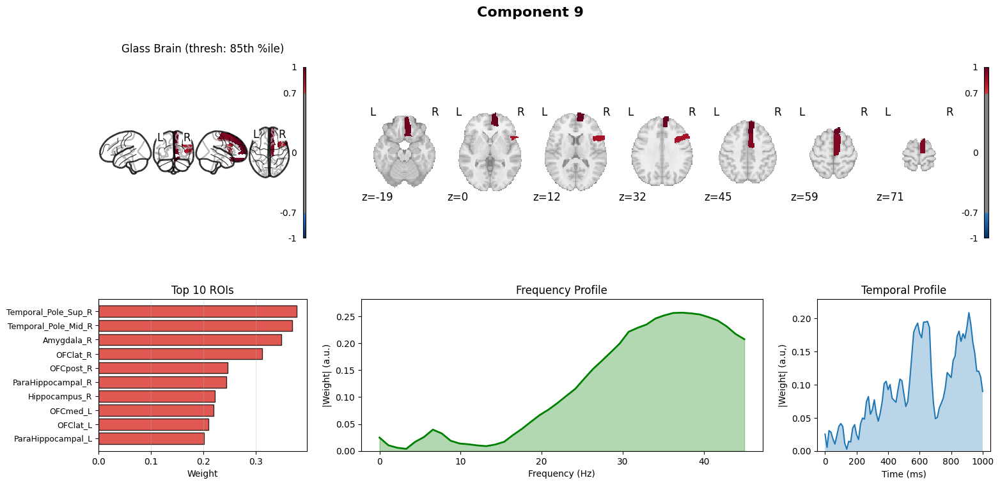


Component 9 Summary:
  Top 5 ROIs: ['Temporal_Pole_Sup_R', 'Temporal_Pole_Mid_R', 'Amygdala_R', 'OFClat_R', 'OFCpost_R']
  Peak frequency: 37.3 Hz
  Peak time: 912 ms


/tmp/ipython-input-2403877401.py:163: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


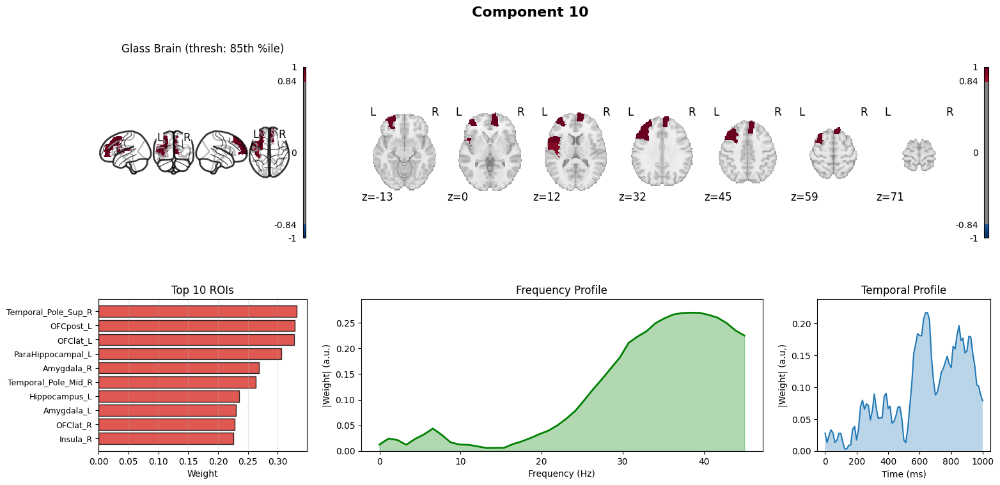


Component 10 Summary:
  Top 5 ROIs: ['Temporal_Pole_Sup_R', 'OFCpost_L', 'OFClat_L', 'ParaHippocampal_L', 'Amygdala_R']
  Peak frequency: 38.4 Hz
  Peak time: 650 ms


/tmp/ipython-input-2403877401.py:163: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


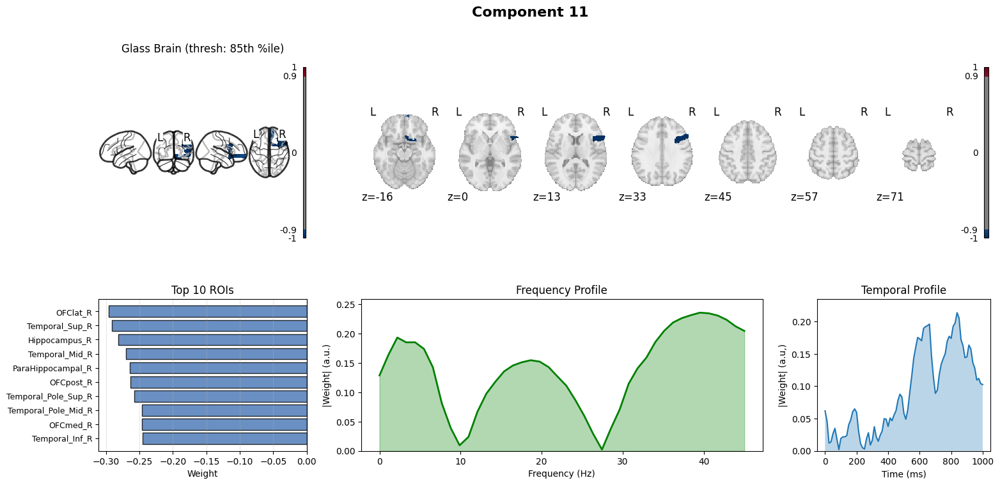


Component 11 Summary:
  Top 5 ROIs: ['OFClat_R', 'Temporal_Sup_R', 'Hippocampus_R', 'Temporal_Mid_R', 'ParaHippocampal_R']
  Peak frequency: 39.5 Hz
  Peak time: 838 ms


/tmp/ipython-input-2403877401.py:163: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


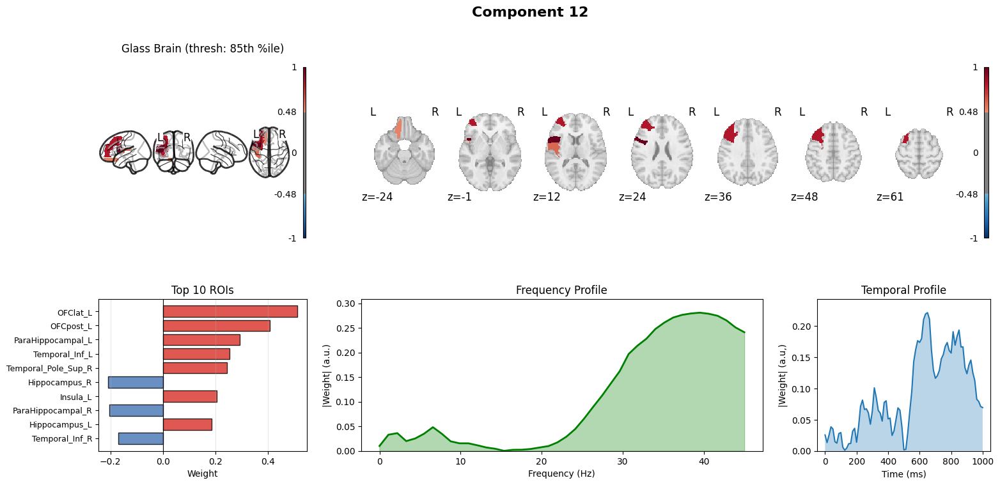


Component 12 Summary:
  Top 5 ROIs: ['OFClat_L', 'OFCpost_L', 'ParaHippocampal_L', 'Temporal_Inf_L', 'Temporal_Pole_Sup_R']
  Peak frequency: 39.5 Hz
  Peak time: 650 ms


KeyboardInterrupt: 

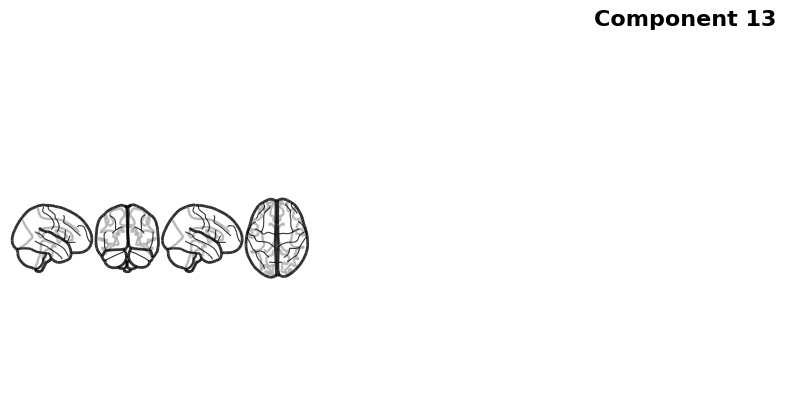

In [333]:
plot_factors_on_atlas(A,B,C,labels_filtered, labels_filtered, aal_nifti_path, threshold_percentile=85)

In [ ]:
weights = [w.to('cpu') for w in weights]

In [ ]:
reorder = np.argsort(weights)
reorder

In [ ]:
weights[9]

In [ ]:
A = A.to('cpu').numpy

In [ ]:
A.shape

In [ ]:
A_reordered = A[:,reorder]

In [ ]:
for i, j in enumerate(reorder):
    assert np.all(A_reordered[:, i] == A[:, j])


In [ ]:
cp_tensor = parafac(log_pow_torch, 17, random_state=None, n_iter_max=5000, tol=1e-9, init='svd')


weights,  factors = cp_tensor
A,B,C = factors

/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


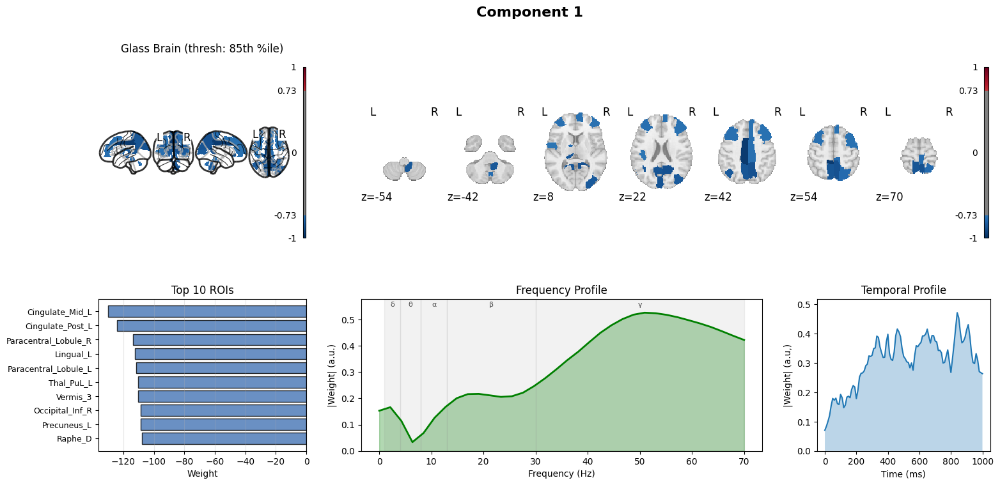


Component 1 Summary:
  Top 5 ROIs: ['Cingulate_Mid_L', 'Cingulate_Post_L', 'Paracentral_Lobule_R', 'Lingual_L', 'Paracentral_Lobule_L']
  Peak frequency: 50.9 Hz
  Peak time: 840 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


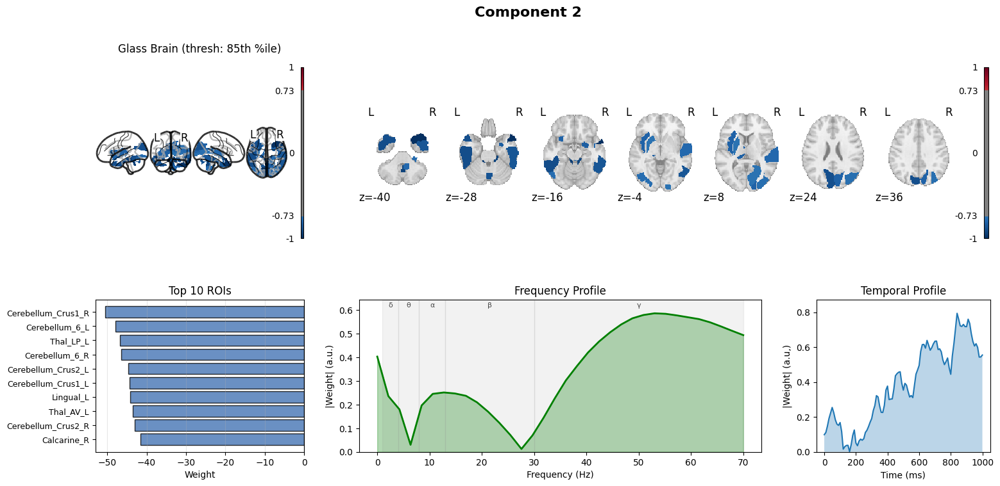


Component 2 Summary:
  Top 5 ROIs: ['Cerebellum_Crus1_R', 'Cerebellum_6_L', 'Thal_LP_L', 'Cerebellum_6_R', 'Cerebellum_Crus2_L']
  Peak frequency: 53.0 Hz
  Peak time: 840 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


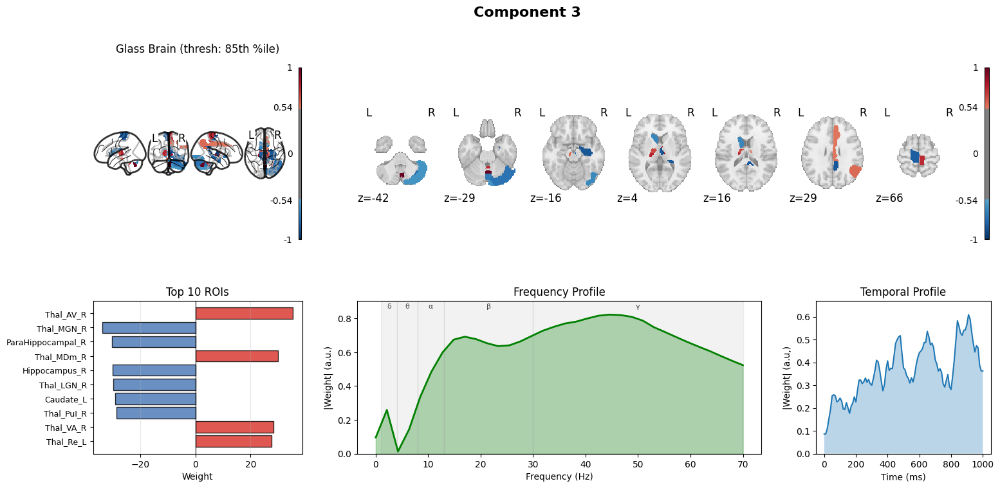


Component 3 Summary:
  Top 5 ROIs: ['Thal_AV_R', 'Thal_MGN_R', 'ParaHippocampal_R', 'Thal_MDm_R', 'Hippocampus_R']
  Peak frequency: 44.5 Hz
  Peak time: 910 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


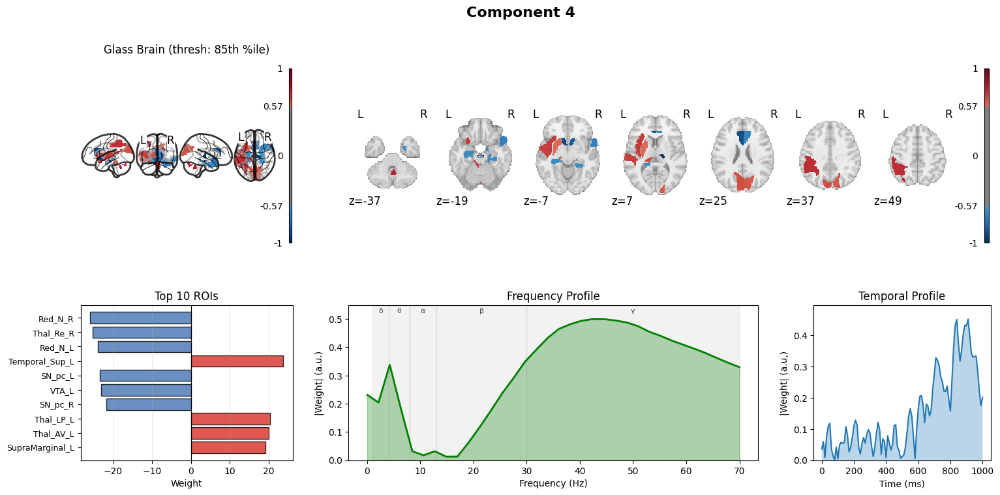


Component 4 Summary:
  Top 5 ROIs: ['Red_N_R', 'Thal_Re_R', 'Red_N_L', 'Temporal_Sup_L', 'SN_pc_L']
  Peak frequency: 42.4 Hz
  Peak time: 910 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


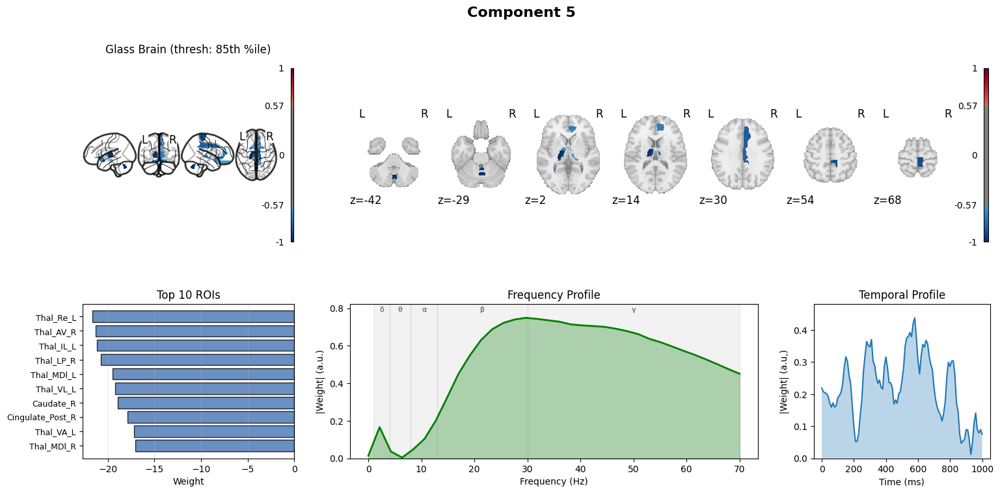


Component 5 Summary:
  Top 5 ROIs: ['Thal_Re_L', 'Thal_AV_R', 'Thal_IL_L', 'Thal_LP_R', 'Thal_MDl_L']
  Peak frequency: 29.7 Hz
  Peak time: 580 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


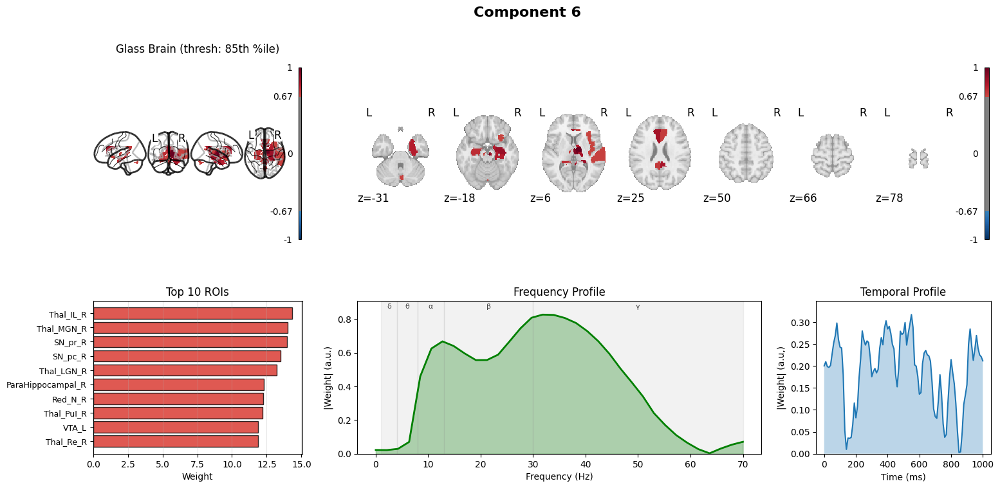


Component 6 Summary:
  Top 5 ROIs: ['Thal_IL_R', 'Thal_MGN_R', 'SN_pr_R', 'SN_pc_R', 'Thal_LGN_R']
  Peak frequency: 31.8 Hz
  Peak time: 550 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


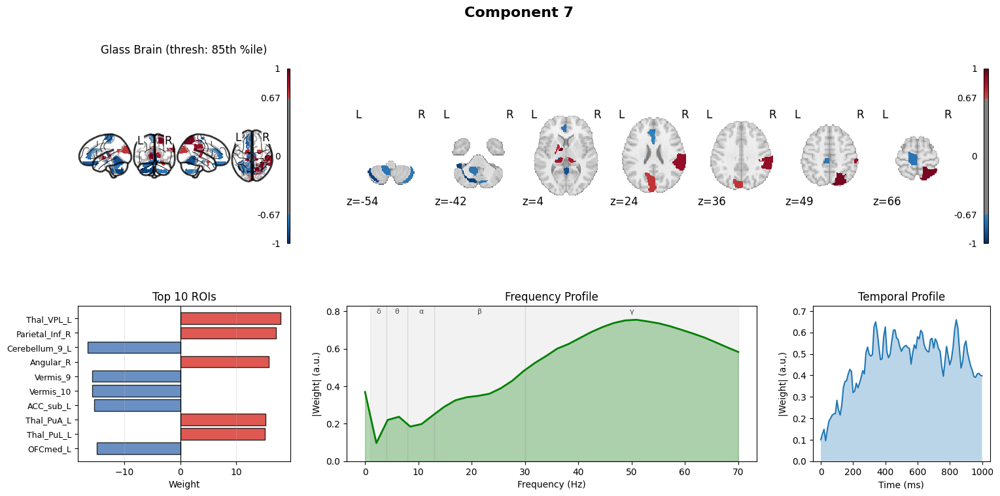


Component 7 Summary:
  Top 5 ROIs: ['Thal_VPL_L', 'Parietal_Inf_R', 'Cerebellum_9_L', 'Angular_R', 'Vermis_9']
  Peak frequency: 50.9 Hz
  Peak time: 840 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


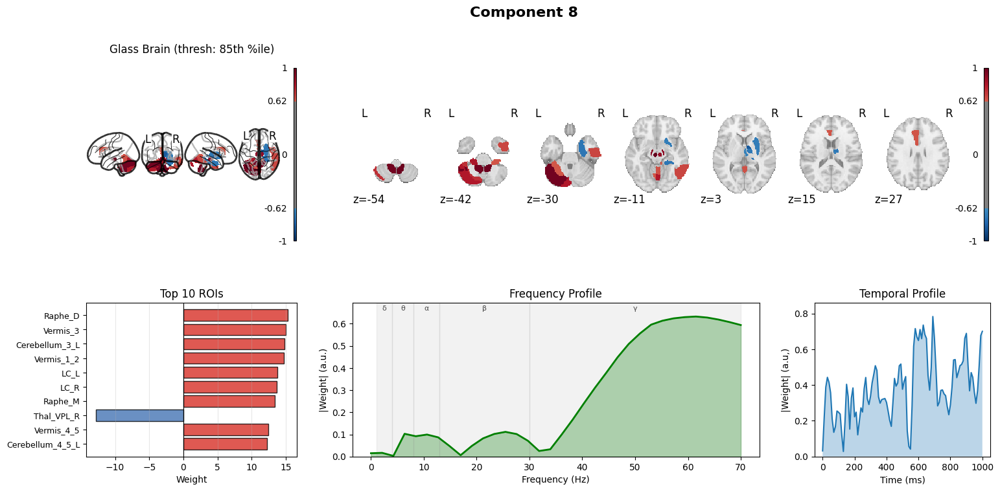


Component 8 Summary:
  Top 5 ROIs: ['Raphe_D', 'Vermis_3', 'Cerebellum_3_L', 'Vermis_1_2', 'LC_L']
  Peak frequency: 61.5 Hz
  Peak time: 690 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


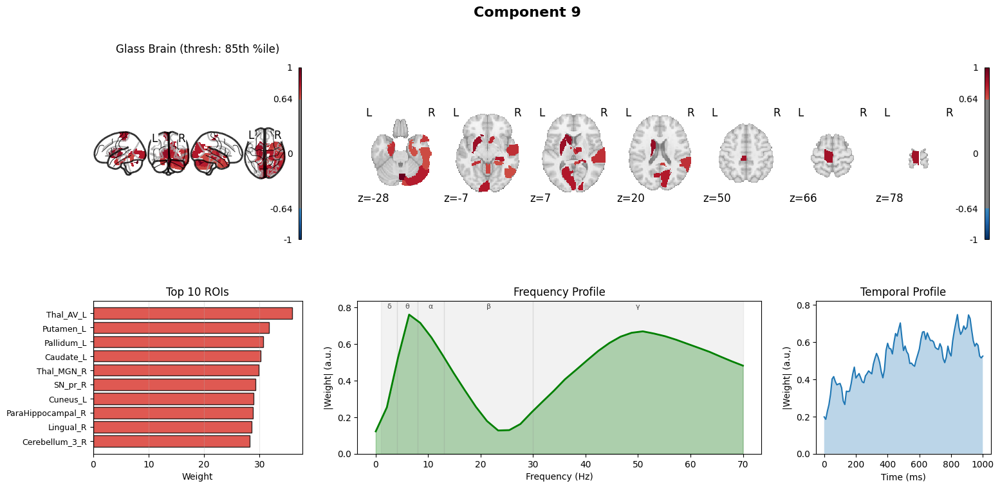


Component 9 Summary:
  Top 5 ROIs: ['Thal_AV_L', 'Putamen_L', 'Pallidum_L', 'Caudate_L', 'Thal_MGN_R']
  Peak frequency: 6.4 Hz
  Peak time: 840 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


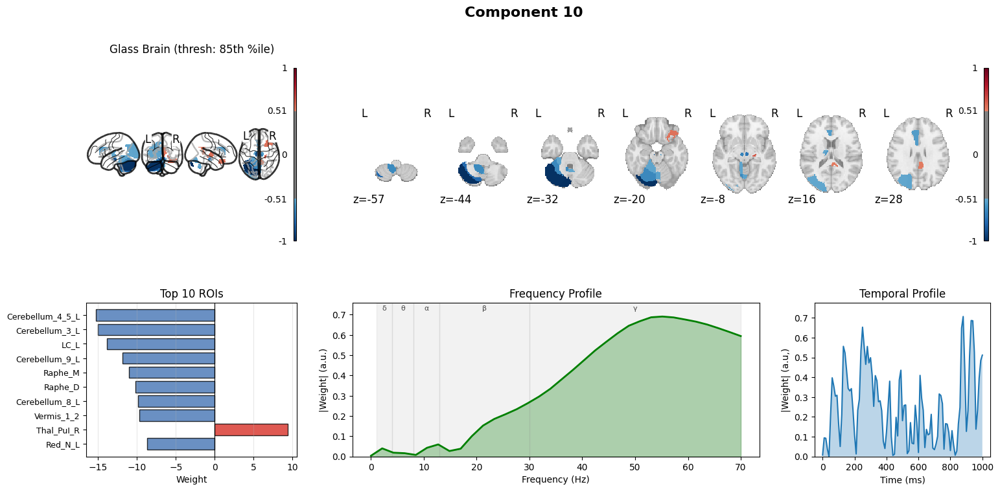


Component 10 Summary:
  Top 5 ROIs: ['Cerebellum_4_5_L', 'Cerebellum_3_L', 'LC_L', 'Cerebellum_9_L', 'Raphe_M']
  Peak frequency: 55.2 Hz
  Peak time: 880 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


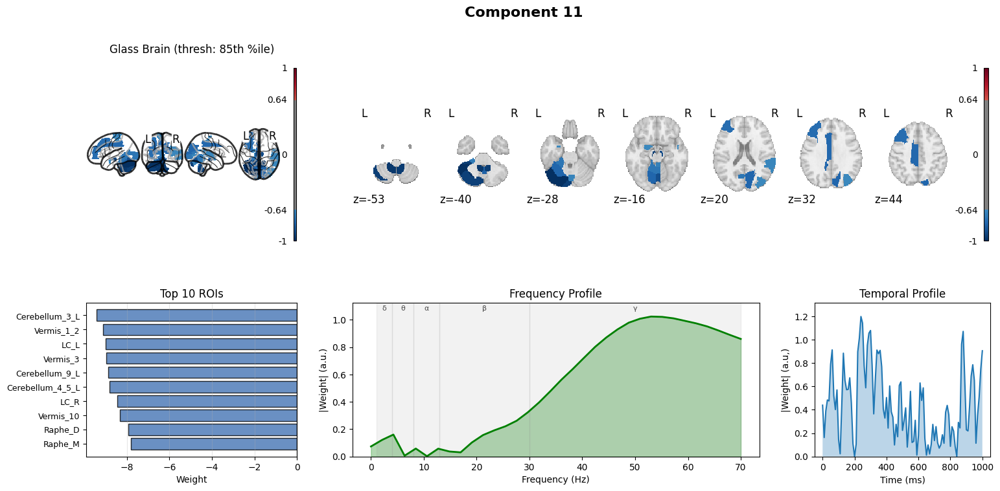


Component 11 Summary:
  Top 5 ROIs: ['Cerebellum_3_L', 'Vermis_1_2', 'LC_L', 'Vermis_3', 'Cerebellum_9_L']
  Peak frequency: 53.0 Hz
  Peak time: 240 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


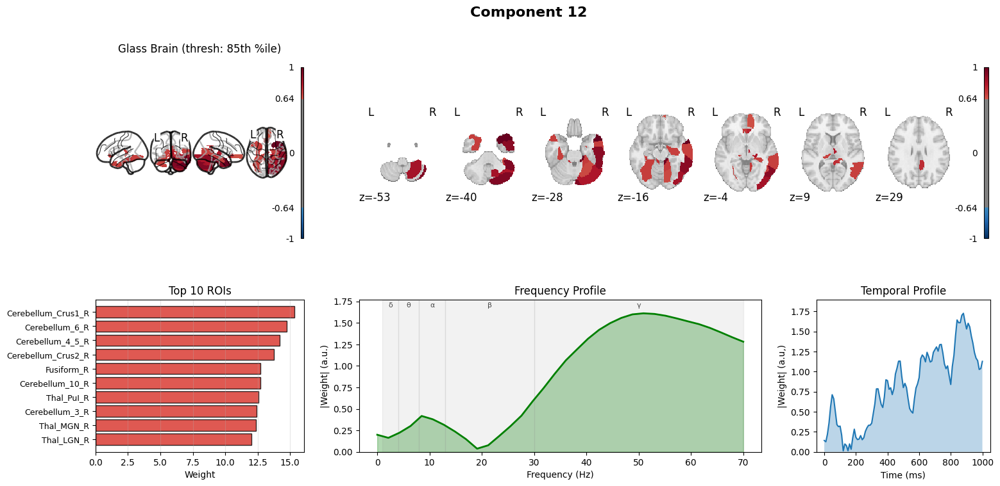


Component 12 Summary:
  Top 5 ROIs: ['Cerebellum_Crus1_R', 'Cerebellum_6_R', 'Cerebellum_4_5_R', 'Cerebellum_Crus2_R', 'Fusiform_R']
  Peak frequency: 50.9 Hz
  Peak time: 880 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


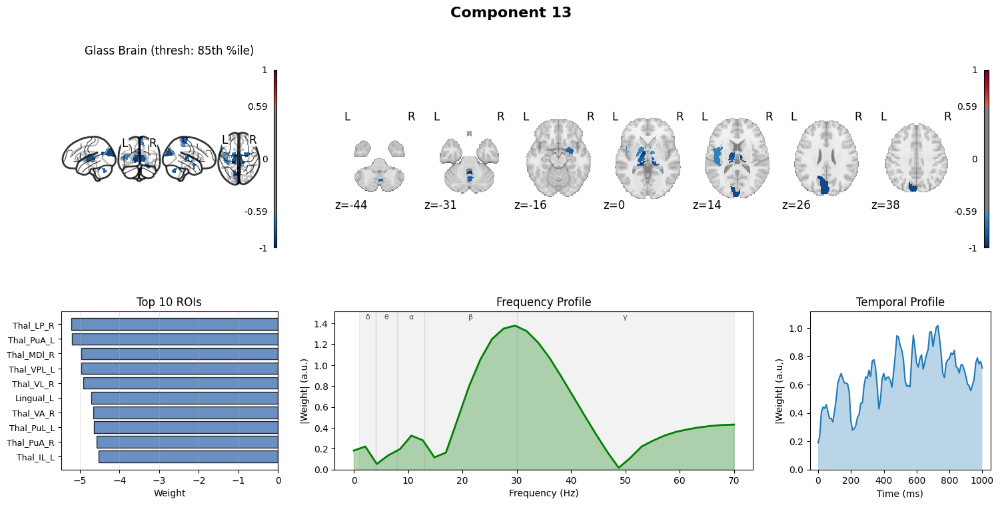


Component 13 Summary:
  Top 5 ROIs: ['Thal_LP_R', 'Thal_PuA_L', 'Thal_MDl_R', 'Thal_VPL_L', 'Thal_VL_R']
  Peak frequency: 29.7 Hz
  Peak time: 730 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


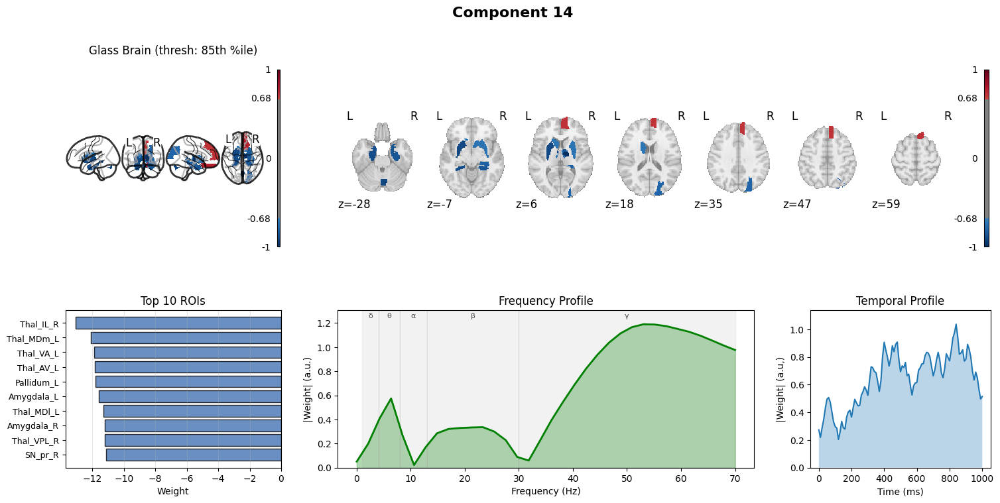


Component 14 Summary:
  Top 5 ROIs: ['Thal_IL_R', 'Thal_MDm_L', 'Thal_VA_L', 'Thal_AV_L', 'Pallidum_L']
  Peak frequency: 53.0 Hz
  Peak time: 840 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


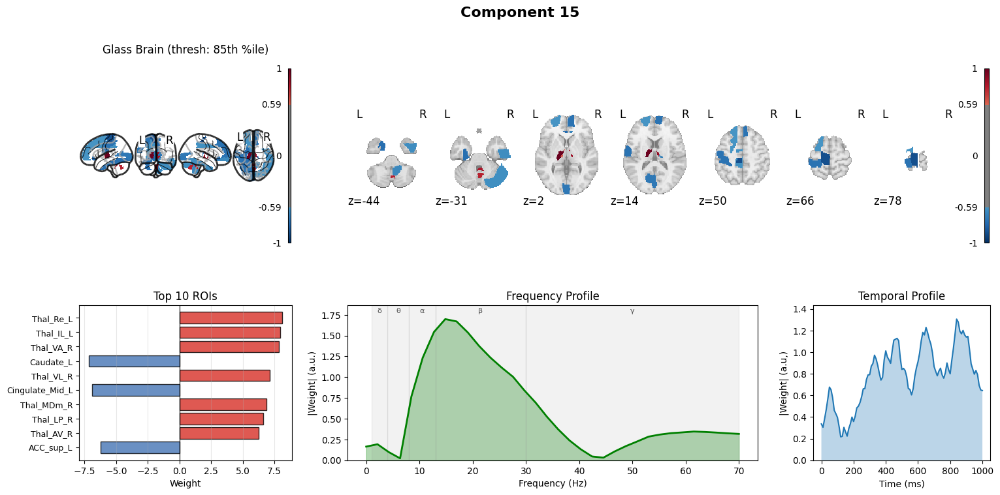


Component 15 Summary:
  Top 5 ROIs: ['Thal_Re_L', 'Thal_IL_L', 'Thal_VA_R', 'Caudate_L', 'Thal_VL_R']
  Peak frequency: 14.8 Hz
  Peak time: 840 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


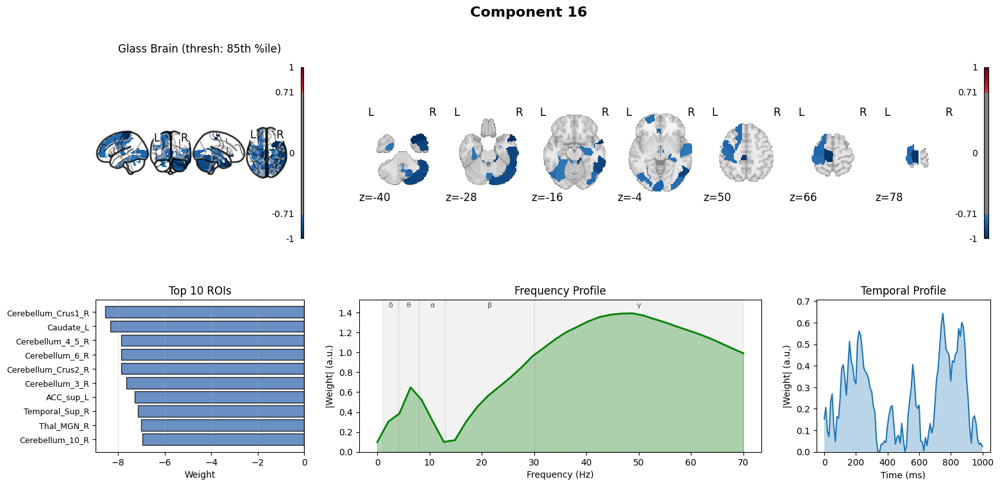


Component 16 Summary:
  Top 5 ROIs: ['Cerebellum_Crus1_R', 'Caudate_L', 'Cerebellum_4_5_R', 'Cerebellum_6_R', 'Cerebellum_Crus2_R']
  Peak frequency: 48.8 Hz
  Peak time: 750 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


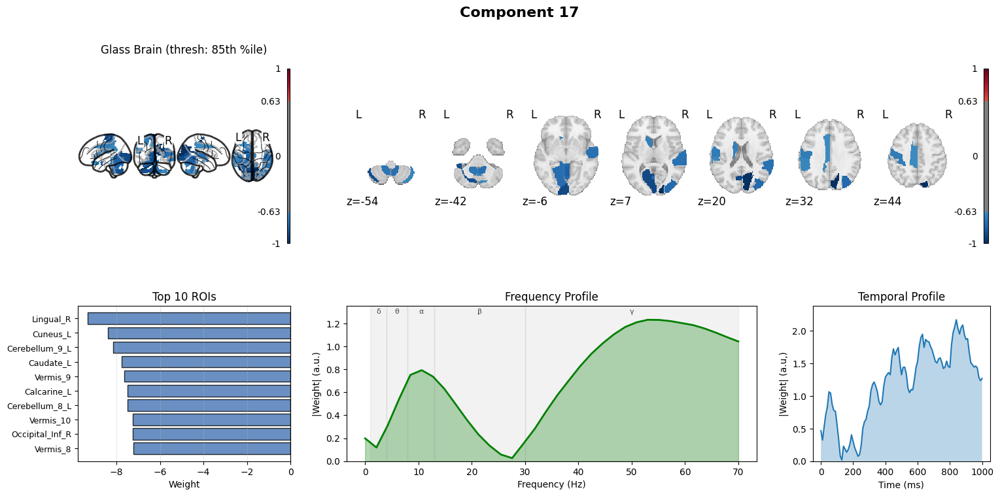


Component 17 Summary:
  Top 5 ROIs: ['Lingual_R', 'Cuneus_L', 'Cerebellum_9_L', 'Caudate_L', 'Vermis_9']
  Peak frequency: 53.0 Hz
  Peak time: 840 ms


In [ ]:
plot_factors_on_atlas(A,B,C,aal3_filtered, aal3_filtered, aal_nifti_path, threshold_percentile=85)

In [ ]:
cp_tensor = parafac(log_pow_torch, 8, random_state=None, n_iter_max=5000, tol=1e-9, init='svd')


weights,  factors = cp_tensor
A,B,C = factors

/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


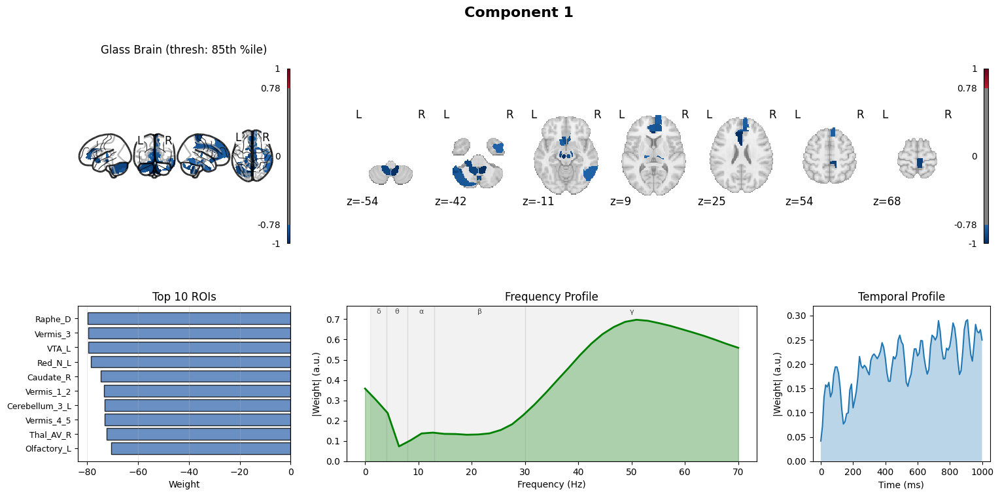


Component 1 Summary:
  Top 5 ROIs: ['Raphe_D', 'Vermis_3', 'VTA_L', 'Red_N_L', 'Caudate_R']
  Peak frequency: 50.9 Hz
  Peak time: 910 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


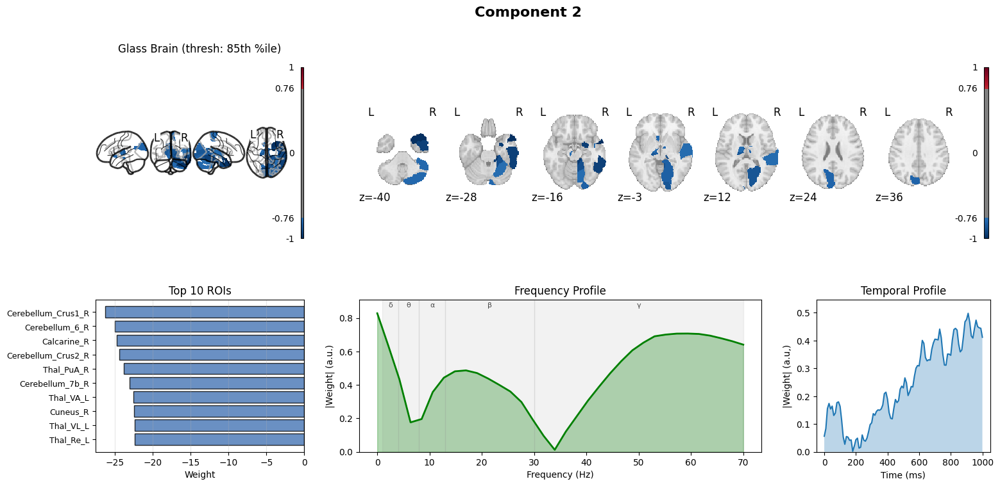


Component 2 Summary:
  Top 5 ROIs: ['Cerebellum_Crus1_R', 'Cerebellum_6_R', 'Calcarine_R', 'Cerebellum_Crus2_R', 'Thal_PuA_R']
  Peak frequency: 0.0 Hz
  Peak time: 910 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


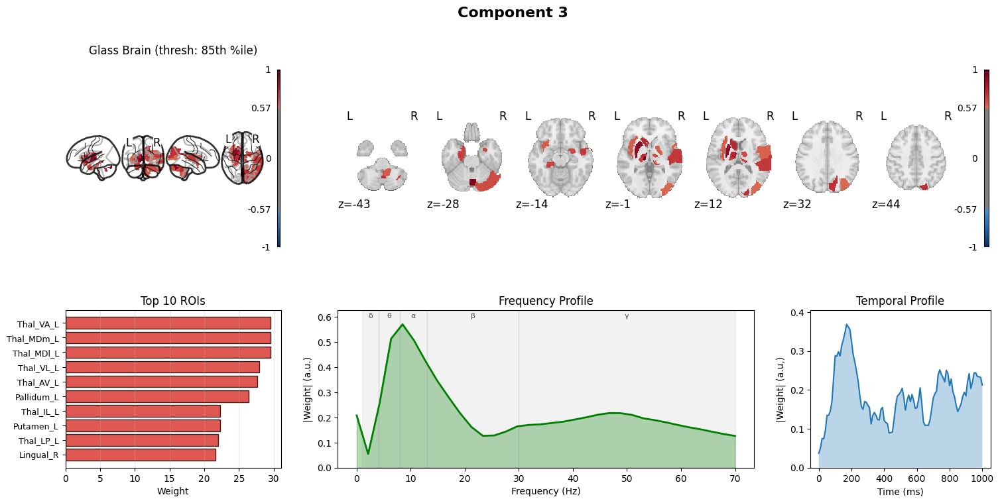


Component 3 Summary:
  Top 5 ROIs: ['Thal_VA_L', 'Thal_MDm_L', 'Thal_MDl_L', 'Thal_VL_L', 'Thal_AV_L']
  Peak frequency: 8.5 Hz
  Peak time: 170 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


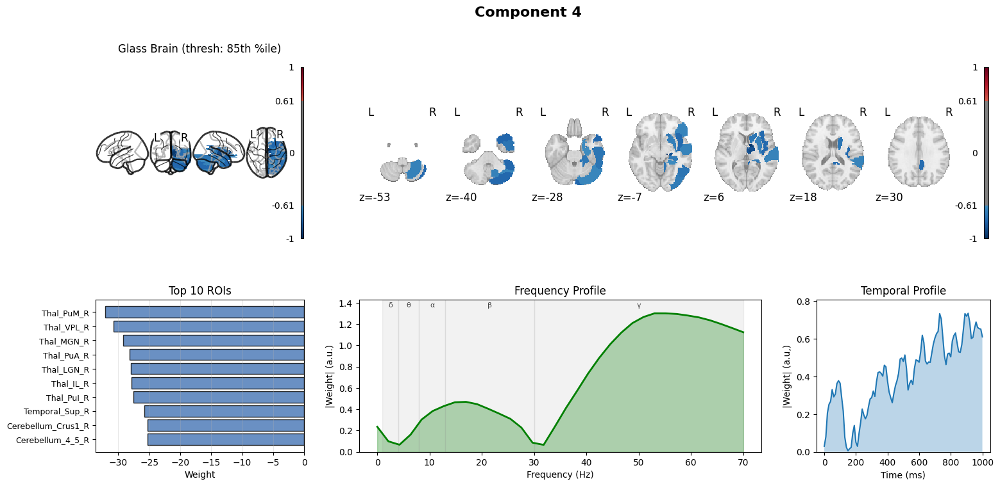


Component 4 Summary:
  Top 5 ROIs: ['Thal_PuM_R', 'Thal_VPL_R', 'Thal_MGN_R', 'Thal_PuA_R', 'Thal_LGN_R']
  Peak frequency: 53.0 Hz
  Peak time: 910 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


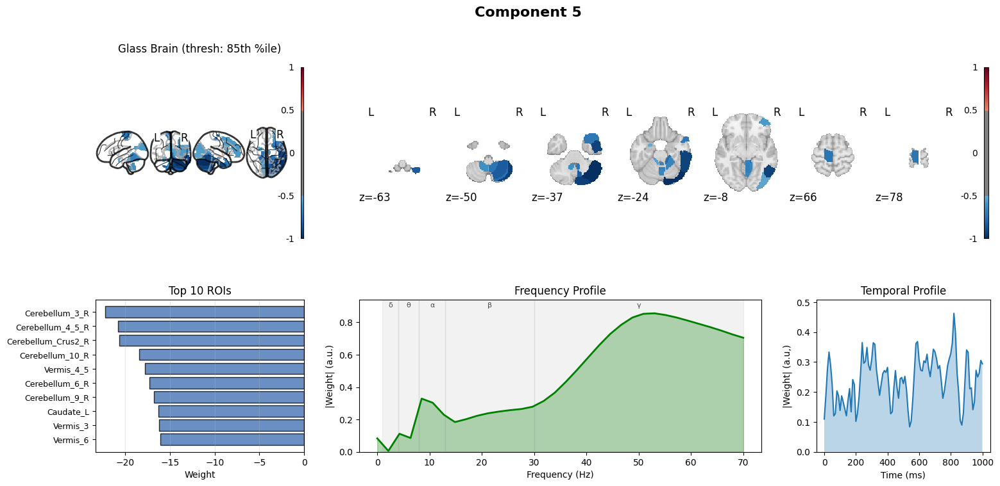


Component 5 Summary:
  Top 5 ROIs: ['Cerebellum_3_R', 'Cerebellum_4_5_R', 'Cerebellum_Crus2_R', 'Cerebellum_10_R', 'Vermis_4_5']
  Peak frequency: 53.0 Hz
  Peak time: 820 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


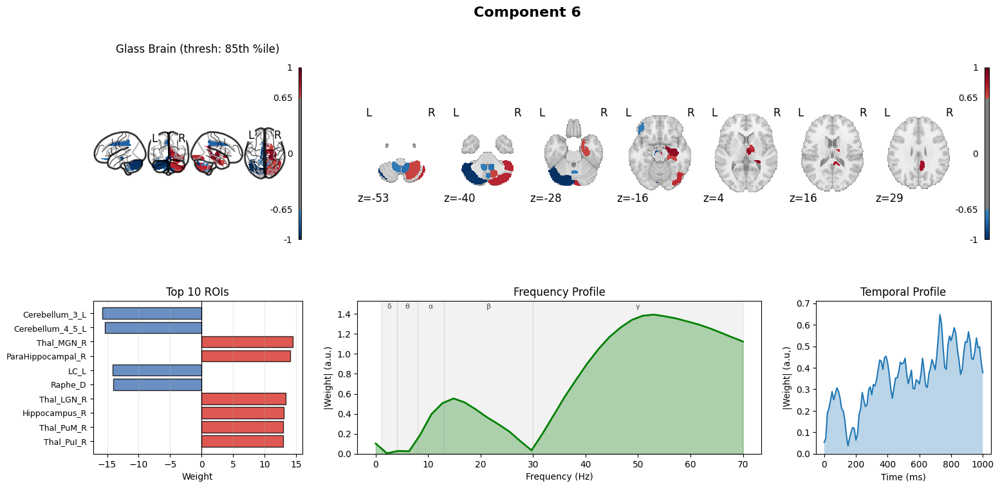


Component 6 Summary:
  Top 5 ROIs: ['Cerebellum_3_L', 'Cerebellum_4_5_L', 'Thal_MGN_R', 'ParaHippocampal_R', 'LC_L']
  Peak frequency: 53.0 Hz
  Peak time: 730 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


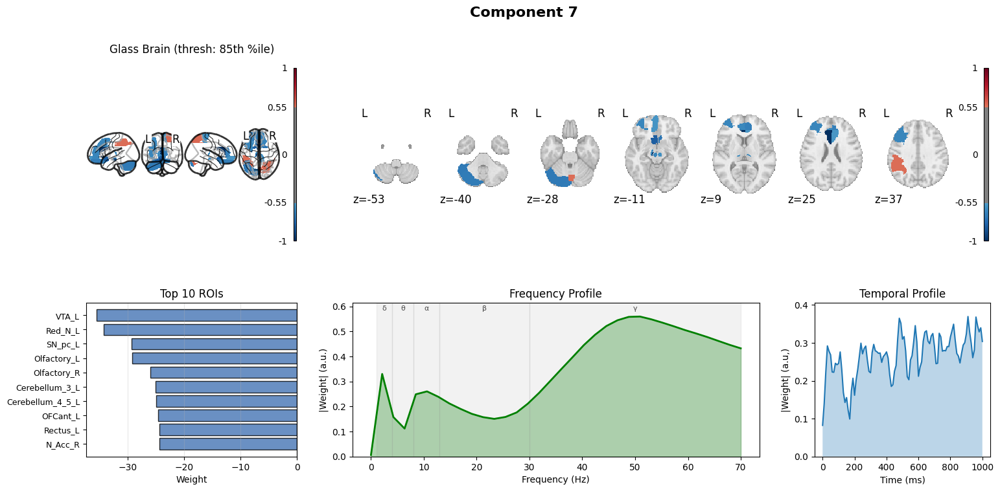


Component 7 Summary:
  Top 5 ROIs: ['VTA_L', 'Red_N_L', 'SN_pc_L', 'Olfactory_L', 'Olfactory_R']
  Peak frequency: 50.9 Hz
  Peak time: 910 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


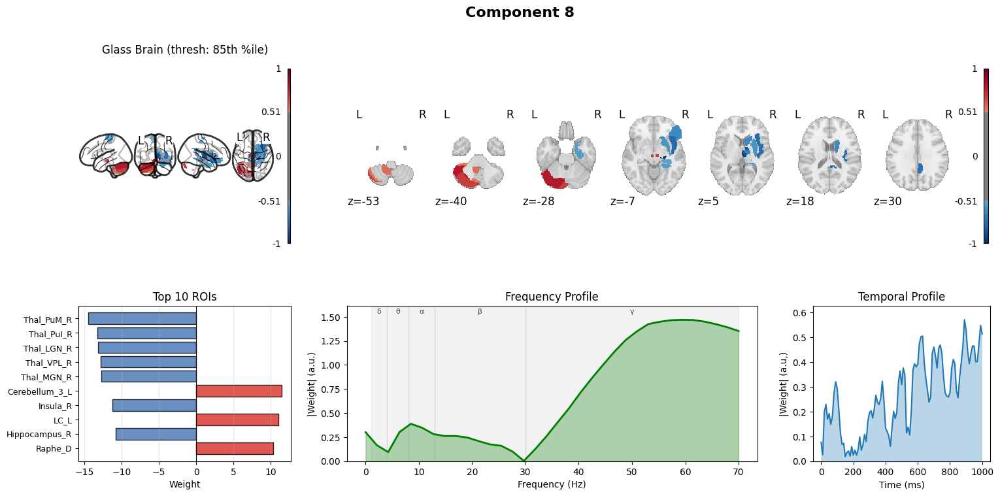


Component 8 Summary:
  Top 5 ROIs: ['Thal_PuM_R', 'Thal_PuI_R', 'Thal_LGN_R', 'Thal_VPL_R', 'Thal_MGN_R']
  Peak frequency: 59.4 Hz
  Peak time: 890 ms


In [ ]:

plot_factors_on_atlas(A,B,C,aal3_filtered, aal3_filtered, aal_nifti_path, threshold_percentile=85)

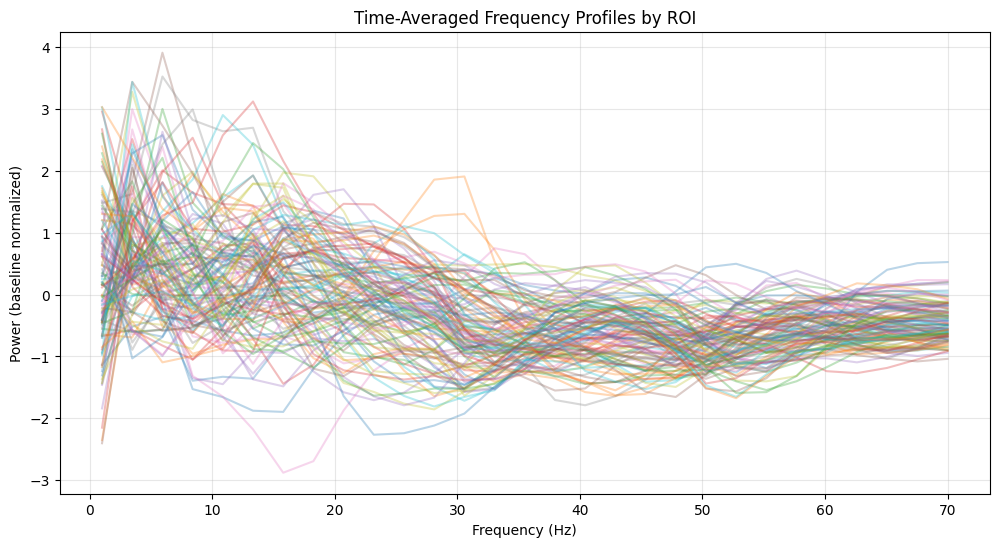

In [128]:
import matplotlib.pyplot as plt
import numpy as np

# Average over time (axis 2)
roi_freq_profiles = pow_norm.mean(axis=2)  # Shape: (ROIs × Frequency)



# Frequency axis (adjust to your actual frequencies)
freq_vec = np.linspace(1, 70, roi_freq_profiles.shape[1])

# Plot all ROIs
plt.figure(figsize=(12, 6))
for i in range(roi_freq_profiles.shape[0]):
    plt.plot(freq_vec, roi_freq_profiles[i, :], alpha=0.3)

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power (baseline normalized)')
plt.title('Time-Averaged Frequency Profiles by ROI')
plt.grid(alpha=0.3)
plt.show()

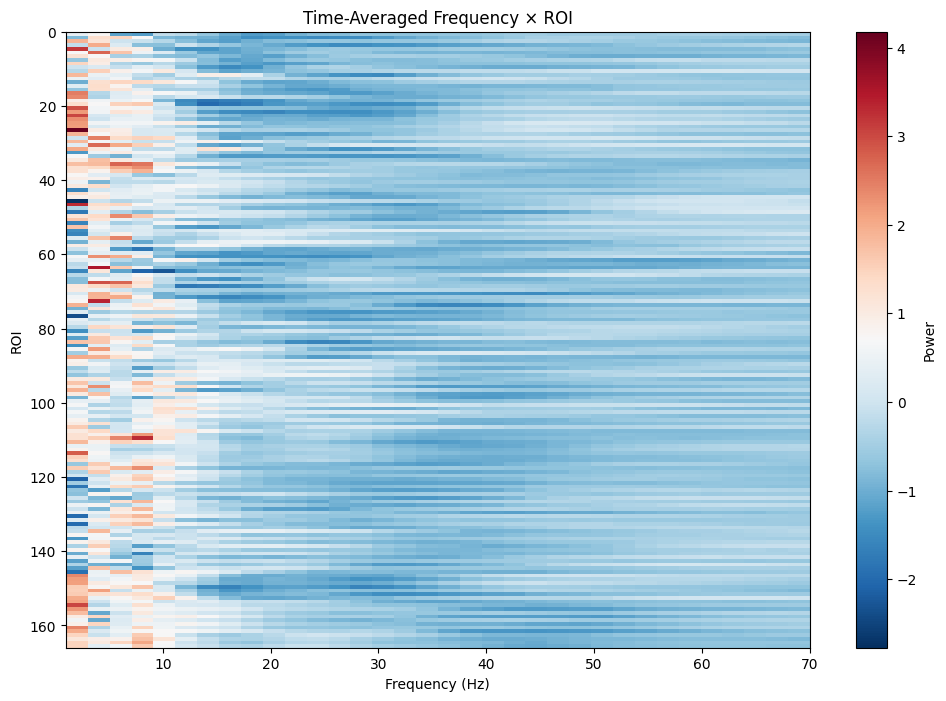

In [ ]:
plt.figure(figsize=(12, 8))
plt.imshow(roi_freq_profiles, aspect='auto', cmap='RdBu_r',
           extent=[freq_vec[0], freq_vec[-1], roi_freq_profiles.shape[0], 0])
plt.colorbar(label='Power')
plt.xlabel('Frequency (Hz)')
plt.ylabel('ROI')
plt.title('Time-Averaged Frequency × ROI')
plt.show()

[(40, 'Hippocampus_L'), (41, 'Hippocampus_R'), (42, 'ParaHippocampal_L'), (43, 'ParaHippocampal_R')]


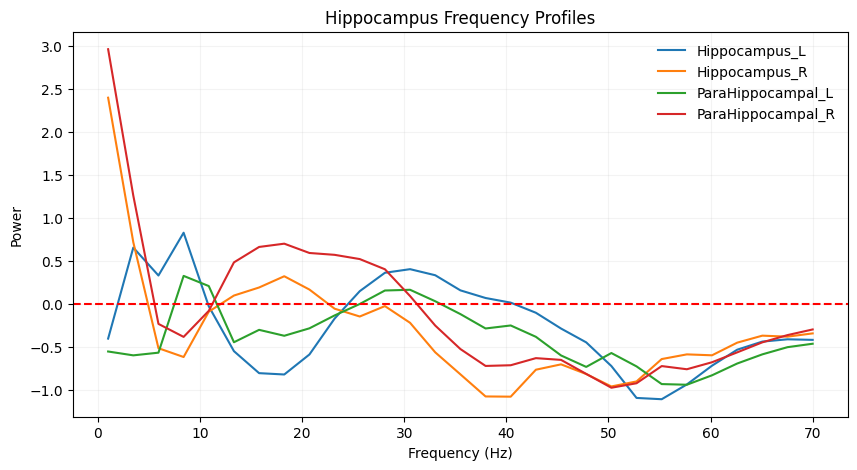

In [129]:

matches = [(i, name) for i, name in enumerate(aal2_full) if 'hipp' in name.lower()]
print(matches)

# Get indices and names
hippo_indices = [i for i, name in matches]
hippo_names = [name for i, name in matches]

# Plot
plt.figure(figsize=(10, 5))
for i, name in zip(hippo_indices, hippo_names):
    plt.plot(freq_vec, roi_freq_profiles[i, :], label=name)

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.title('Hippocampus Frequency Profiles')
plt.legend(framealpha=0)
plt.grid(alpha=0.15)
plt.axhline(0,color='red',ls='--')
plt.show()

In [ ]:

matches = [(i, name) for i, name in enumerate(aal3_filtered) if 'ACC_' in name.lower()]
print(matches)

[]


[(146, 'ACC_sub_L'), (147, 'ACC_sub_R'), (148, 'ACC_pre_L'), (149, 'ACC_pre_R'), (150, 'ACC_sup_L'), (151, 'ACC_sup_R'), (152, 'N_Acc_L'), (153, 'N_Acc_R')]


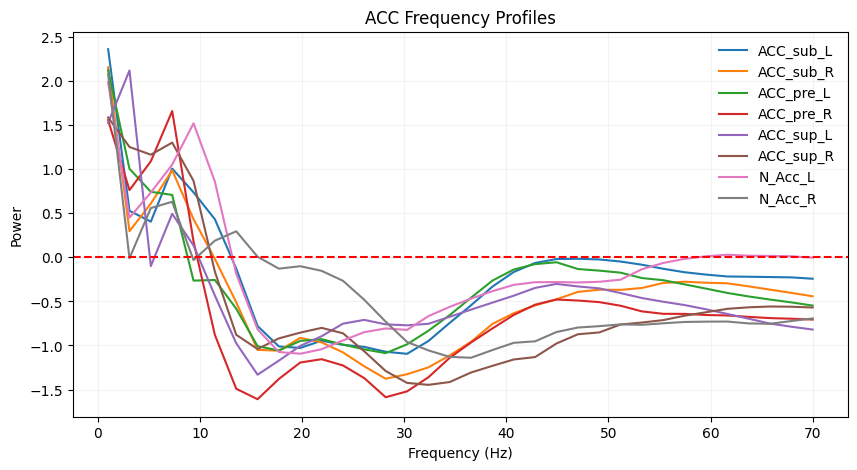

In [ ]:

matches = [(i, name) for i, name in enumerate(aal3_filtered) if 'acc' in name.lower()]
print(matches)

# Get indices and names
hippo_indices = [i for i, name in matches]
hippo_names = [name for i, name in matches]

# Plot
plt.figure(figsize=(10, 5))
for i, name in zip(hippo_indices, hippo_names):
    plt.plot(freq_vec, roi_freq_profiles[i, :], label=name)

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.title('ACC Frequency Profiles')
plt.legend(framealpha=0)
plt.grid(alpha=0.15)
plt.axhline(0,color='red',ls='--')
plt.show()

[(24, 'OFCmed_L'), (25, 'OFCmed_R'), (26, 'OFCant_L'), (27, 'OFCant_R'), (28, 'OFCpost_L'), (29, 'OFCpost_R'), (30, 'OFClat_L'), (31, 'OFClat_R')]


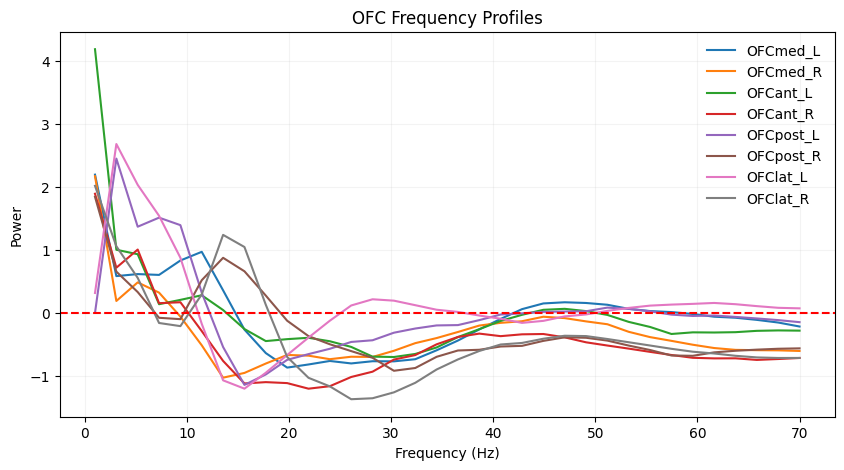

In [ ]:

matches = [(i, name) for i, name in enumerate(aal3_filtered) if 'ofc' in name.lower()]
print(matches)

# Get indices and names
hippo_indices = [i for i, name in matches]
hippo_names = [name for i, name in matches]

# Plot
plt.figure(figsize=(10, 5))
for i, name in zip(hippo_indices, hippo_names):
    plt.plot(freq_vec, roi_freq_profiles[i, :], label=name)

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.title('OFC Frequency Profiles')
plt.legend(framealpha=0)
plt.grid(alpha=0.15)
plt.axhline(0,color='red',ls='--')
plt.show()

[(42, 'Amygdala_L'), (43, 'Amygdala_R')]


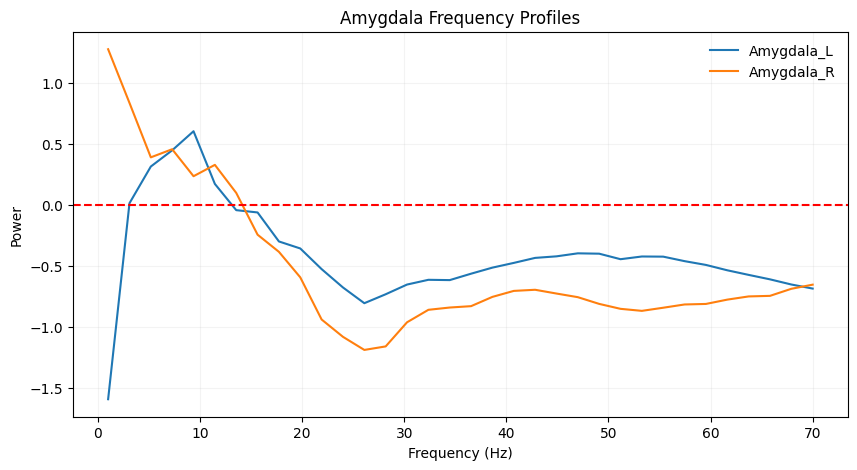

In [ ]:

matches = [(i, name) for i, name in enumerate(aal3_filtered) if 'amy' in name.lower()]
print(matches)

# Get indices and names
hippo_indices = [i for i, name in matches]
hippo_names = [name for i, name in matches]

# Plot
plt.figure(figsize=(10, 5))
for i, name in zip(hippo_indices, hippo_names):
    plt.plot(freq_vec, roi_freq_profiles[i, :], label=name)

plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.title('Amygdala Frequency Profiles')
plt.legend(framealpha=0)
plt.grid(alpha=0.15)
plt.axhline(0,color='red',ls='--')

plt.show()

[(42, 'Amygdala_L'), (43, 'Amygdala_R')]


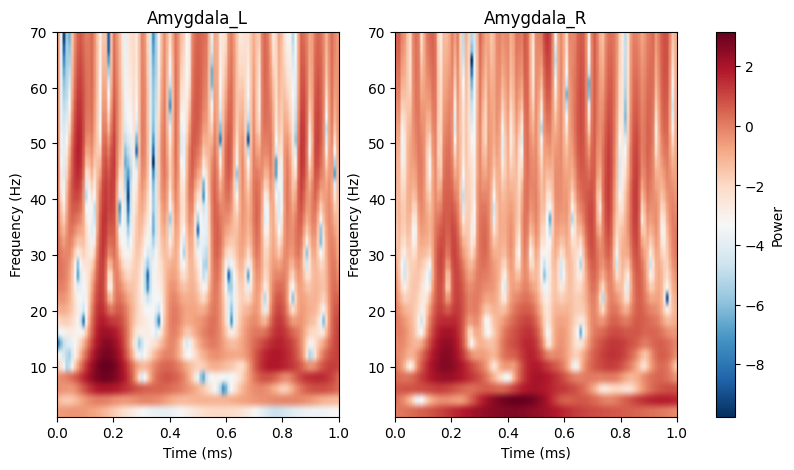

In [ ]:
matches = [(i, name) for i, name in enumerate(aal3_filtered) if 'amy' in name.lower()]
print(matches)

# Get indices and names
hippo_idx = [i for i, name in matches]
hippo_names = [name for i, name in matches]



fig, axes = plt.subplots(1, len(hippo_idx), figsize=(5*len(hippo_idx), 5))

for ax, idx in zip(axes, hippo_idx):
    roi_data = pow_norm[idx, :, :].cpu().numpy() if hasattr(pow_norm, 'cpu') else pow_norm[idx, :, :]

    im = ax.imshow(roi_data, aspect='auto', cmap='RdBu_r', origin='lower',
                   extent=[time_vec[0], time_vec[-1], freq_vec[0], freq_vec[-1]])
    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('Frequency (Hz)')
    ax.set_title(aal3_filtered[idx])

plt.colorbar(im, ax=axes, label='Power')



[(38, 'Hippocampus_L'), (39, 'Hippocampus_R'), (40, 'ParaHippocampal_L'), (41, 'ParaHippocampal_R')]


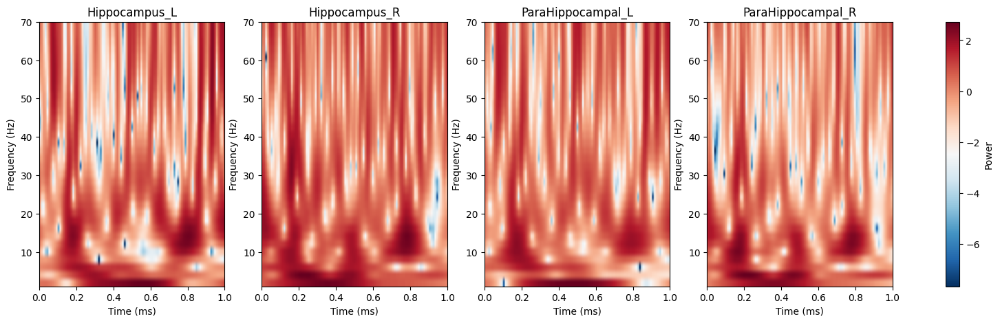

In [ ]:
matches = [(i, name) for i, name in enumerate(aal3_filtered) if 'hippo' in name.lower()]
print(matches)

# Get indices and names
hippo_idx = [i for i, name in matches]
hippo_names = [name for i, name in matches]



fig, axes = plt.subplots(1, len(hippo_idx), figsize=(5*len(hippo_idx), 5))

for ax, idx in zip(axes, hippo_idx):
    roi_data = pow_norm[idx, :, :].cpu().numpy() if hasattr(pow_norm, 'cpu') else pow_norm[idx, :, :]

    im = ax.imshow(roi_data, aspect='auto', cmap='RdBu_r', origin='lower',
                   extent=[time_vec[0], time_vec[-1], freq_vec[0], freq_vec[-1]])
    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('Frequency (Hz)')
    ax.set_title(aal3_filtered[idx])

plt.colorbar(im, ax=axes, label='Power')



[(146, 'ACC_sub_L'), (147, 'ACC_sub_R'), (148, 'ACC_pre_L'), (149, 'ACC_pre_R'), (150, 'ACC_sup_L'), (151, 'ACC_sup_R'), (152, 'N_Acc_L'), (153, 'N_Acc_R')]


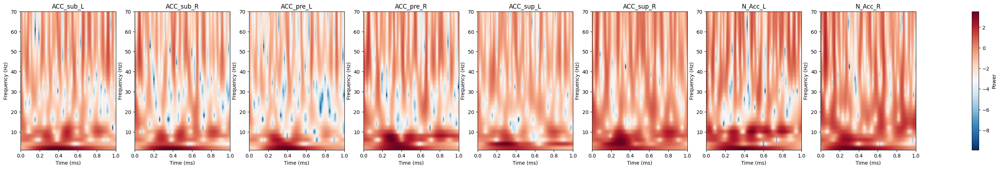

In [ ]:
matches = [(i, name) for i, name in enumerate(aal3_filtered) if 'acc' in name.lower()]
print(matches)

# Get indices and names
hippo_idx = [i for i, name in matches]
hippo_names = [name for i, name in matches]



fig, axes = plt.subplots(1, len(hippo_idx), figsize=(5*len(hippo_idx), 5))

for ax, idx in zip(axes, hippo_idx):
    roi_data = pow_norm[idx, :, :].cpu().numpy() if hasattr(pow_norm, 'cpu') else pow_norm[idx, :, :]

    im = ax.imshow(roi_data, aspect='auto', cmap='RdBu_r', origin='lower',
                   extent=[time_vec[0], time_vec[-1], freq_vec[0], freq_vec[-1]])
    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('Frequency (Hz)')
    ax.set_title(aal3_filtered[idx])

plt.colorbar(im, ax=axes, label='Power')



In [ ]:
# Keep frequencies from index 3 onwards
pow_filtered = pow_norm[:, 3:, :]

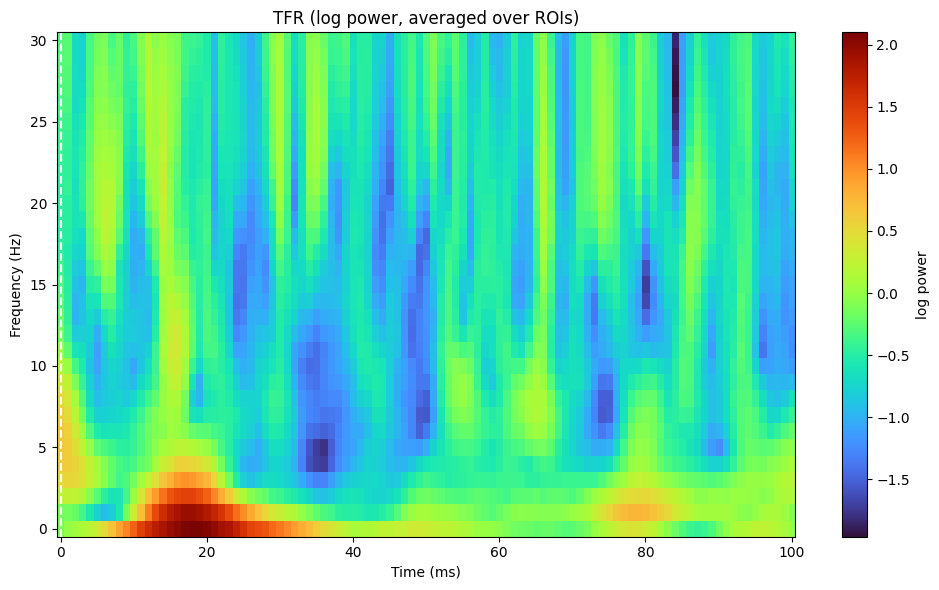

In [ ]:
pow_avg = np.nanmean(pow_filtered, axis=(0))  # [Freq x Time]

plt.figure(figsize=(10, 6))
plt.imshow(pow_avg, aspect='auto', origin='lower',cmap='turbo')
plt.xlabel('Time (ms)')
plt.ylabel('Frequency (Hz)')
plt.title('TFR (log power, averaged over ROIs)')
plt.colorbar(label='log power')
plt.axvline(0, color='white', linestyle='--')
plt.tight_layout()
plt.show()

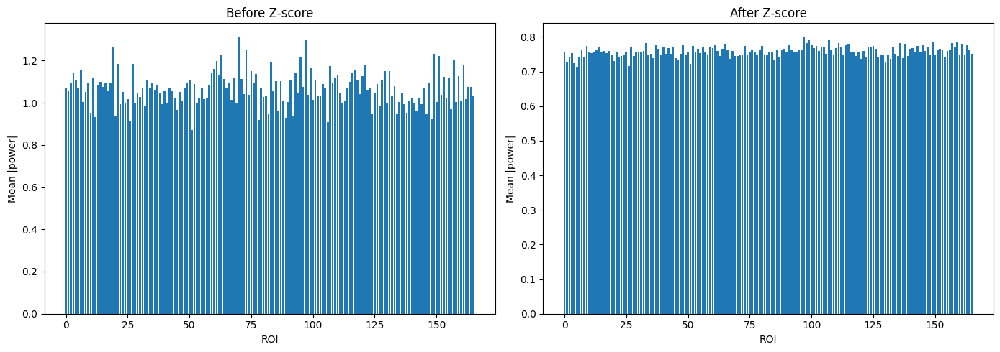

In [ ]:
# Numpy
mean = pow_norm.mean(axis=(1, 2), keepdims=True)
std = pow_norm.std(axis=(1, 2), keepdims=True)
tensor_norm = (pow_norm - mean) / (std)

# Power distribution per ROI
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Before
roi_power_before = np.abs(pow_filtered).mean(axis=(1, 2))
axes[0].bar(range(len(roi_power_before)), roi_power_before)
axes[0].set_xlabel('ROI')
axes[0].set_ylabel('Mean |power|')
axes[0].set_title('Before Z-score')

# After
roi_power_after = np.abs(tensor_norm).mean(axis=(1, 2))
axes[1].bar(range(len(roi_power_after)), roi_power_after)
axes[1].set_xlabel('ROI')
axes[1].set_ylabel('Mean |power|')
axes[1].set_title('After Z-score')

plt.tight_layout()
plt.show()

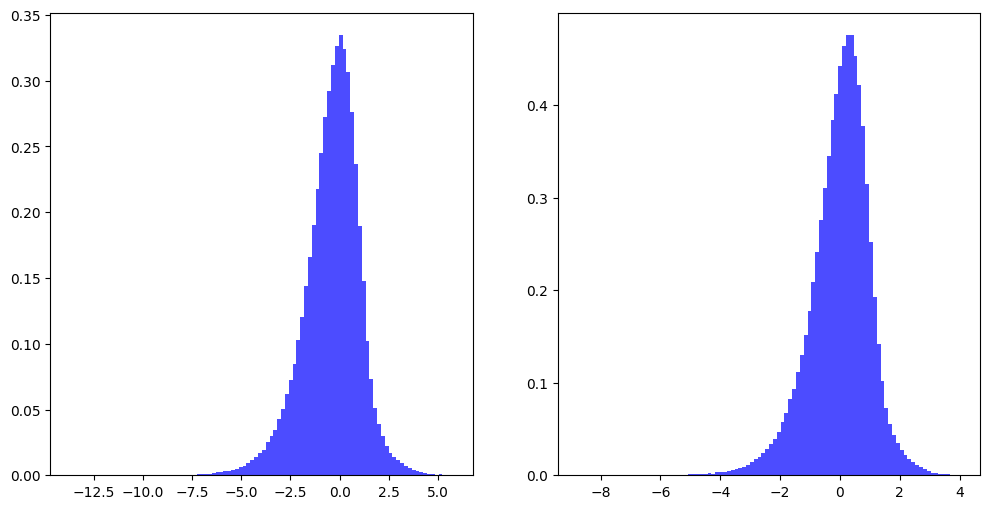

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(12,6))

ax[0].hist(pow_norm.ravel(), bins=100, density=True, color='blue', alpha=0.7);
ax[1].hist(tensor_norm.ravel(), bins=100, density=True, color='blue', alpha=0.7);

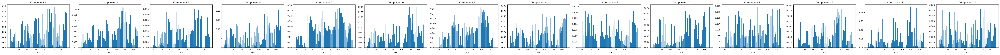

In [ ]:
weights, factors = cp_tensor
A = factors[0]
A = [f.to('cpu') for f in A]
A = np.array(A)

# Plot loading distribution for each component
fig, axes = plt.subplots(1, A.shape[1], figsize=(5*A.shape[1], 4))
for r in range(A.shape[1]):
    axes[r].bar(range(A.shape[0]), np.abs(A[:, r]))
    axes[r].set_title(f'Component {r+1}')
    axes[r].set_xlabel('ROI')
plt.tight_layout()
plt.show()

In [ ]:
# Remove thalamus
thal_idx = [i for i, name in enumerate(aal3_filtered) if 'thal' in name.lower()]
keep_idx = [i for i in range(tensor_norm.shape[0]) if i not in thal_idx]

tensor_no_thal = tensor_norm[keep_idx]
labels_no_thal = [aal3_filtered[i] for i in keep_idx]

# Remove vermis
vermis_idx = [i for i, name in enumerate(aal3_filtered) if 'vermis' in name.lower()]
keep_idx = [i for i in range(tensor_no_thal.shape[0]) if i not in vermis_idx]

tensor_no_thal_vermis = tensor_no_thal[keep_idx]
labels_no_thal_vermis = [labels_no_thal[i] for i in keep_idx]

# Remove cerebellum
cerebellum_idx = [i for i, name in enumerate(aal3_filtered) if 'cere' in name.lower()]
keep_idx = [i for i in range(tensor_no_thal_vermis.shape[0]) if i not in cerebellum_idx]

tensor_no_thal_vermis_cerebellum = tensor_no_thal_vermis[keep_idx]
labels_no_thal_vermis_cerebellum = [labels_no_thal_vermis[i] for i in keep_idx]

Text(0, 0.5, 'Mean |power|')

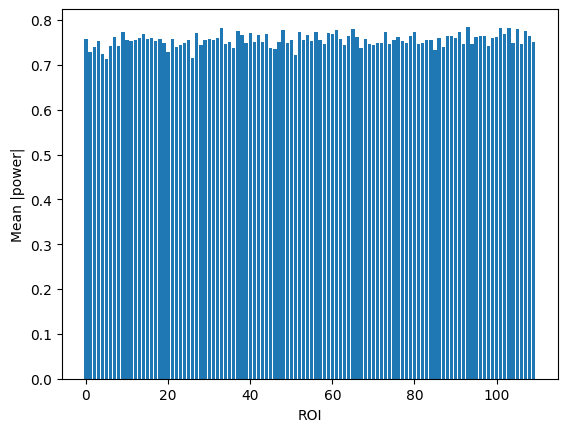

In [ ]:
plt.figure()
roi_power_after = np.abs(tensor_no_thal_vermis_cerebellum).mean(axis=(1, 2))
plt.bar(range(len(roi_power_after)), roi_power_after)
plt.xlabel('ROI')
plt.ylabel('Mean |power|')

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
tensor_no_thal_vermis_cerebellum_torch = torch.as_tensor(tensor_no_thal_vermis_cerebellum, device=device, dtype=torch.float32)
tensor_no_thal_vermis_cerebellum_torch.shape[0]

110

In [ ]:
cp_tensor = parafac(tensor_no_thal_vermis_cerebellum_torch, rank=10, random_state=None, n_iter_max=5000, tol=1e-9, init='svd', normalize_factors=True)

In [ ]:
weights,  factors = cp_tensor
A,B,C = factors

/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


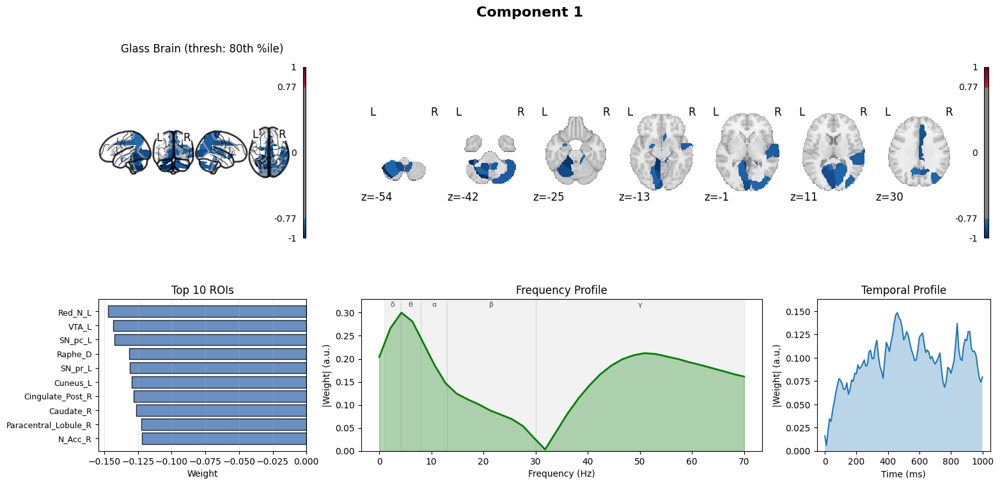


Component 1 Summary:
  Top 5 ROIs: ['Red_N_L', 'VTA_L', 'SN_pc_L', 'Raphe_D', 'SN_pr_L']
  Peak frequency: 4.2 Hz
  Peak time: 460 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


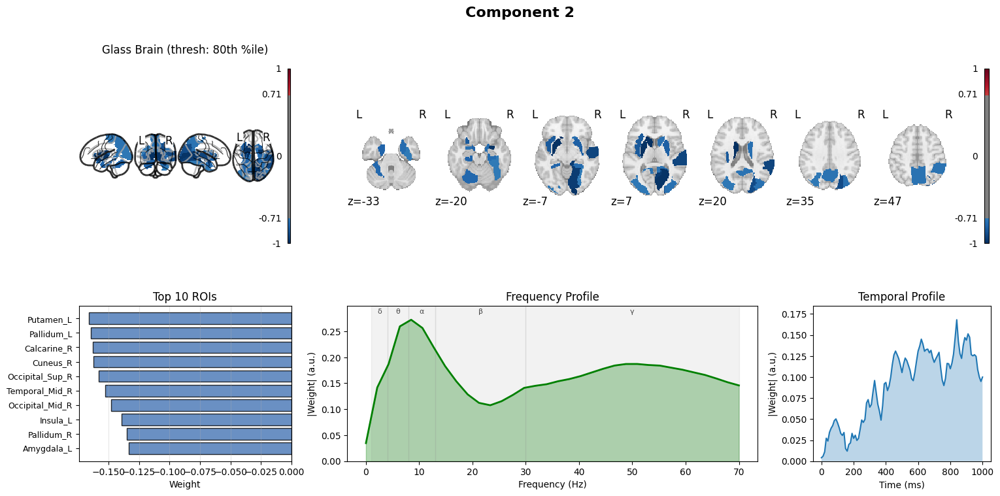


Component 2 Summary:
  Top 5 ROIs: ['Putamen_L', 'Pallidum_L', 'Calcarine_R', 'Cuneus_R', 'Occipital_Sup_R']
  Peak frequency: 8.5 Hz
  Peak time: 840 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


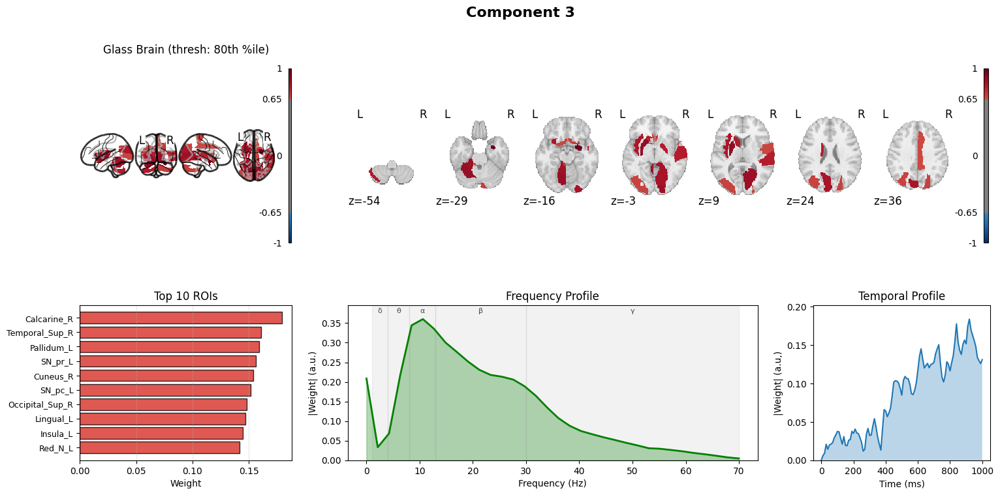


Component 3 Summary:
  Top 5 ROIs: ['Calcarine_R', 'Temporal_Sup_R', 'Pallidum_L', 'SN_pr_L', 'Cuneus_R']
  Peak frequency: 10.6 Hz
  Peak time: 920 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


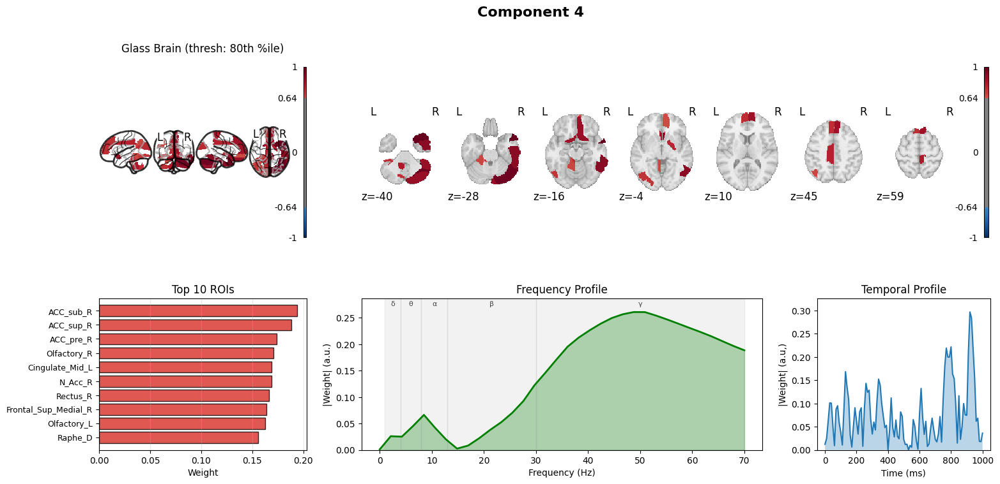


Component 4 Summary:
  Top 5 ROIs: ['ACC_sub_R', 'ACC_sup_R', 'ACC_pre_R', 'Olfactory_R', 'Cingulate_Mid_L']
  Peak frequency: 48.8 Hz
  Peak time: 920 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


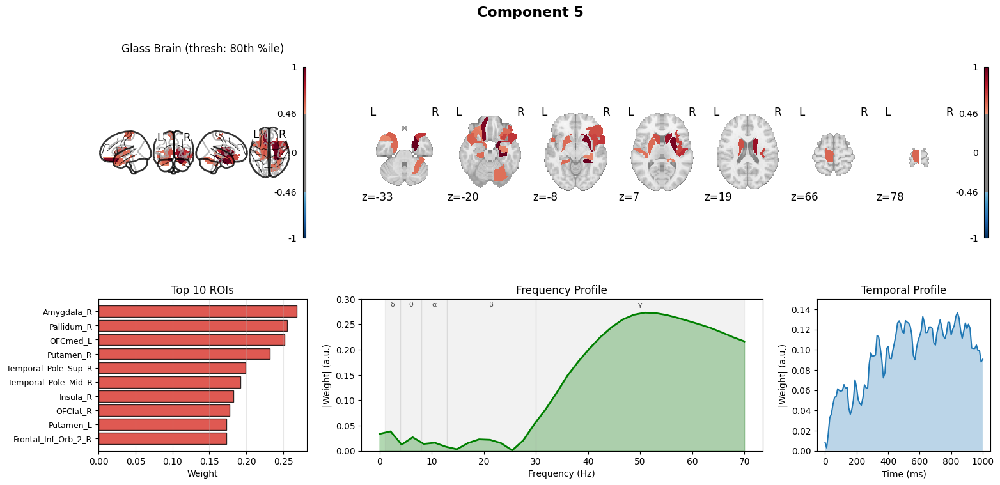


Component 5 Summary:
  Top 5 ROIs: ['Amygdala_R', 'Pallidum_R', 'OFCmed_L', 'Putamen_R', 'Temporal_Pole_Sup_R']
  Peak frequency: 50.9 Hz
  Peak time: 840 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


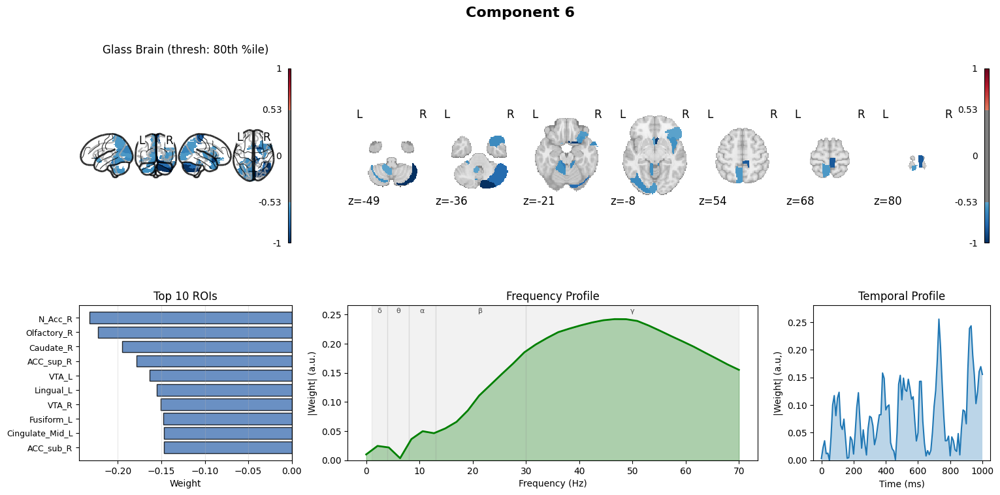


Component 6 Summary:
  Top 5 ROIs: ['N_Acc_R', 'Olfactory_R', 'Caudate_R', 'ACC_sup_R', 'VTA_L']
  Peak frequency: 46.7 Hz
  Peak time: 730 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


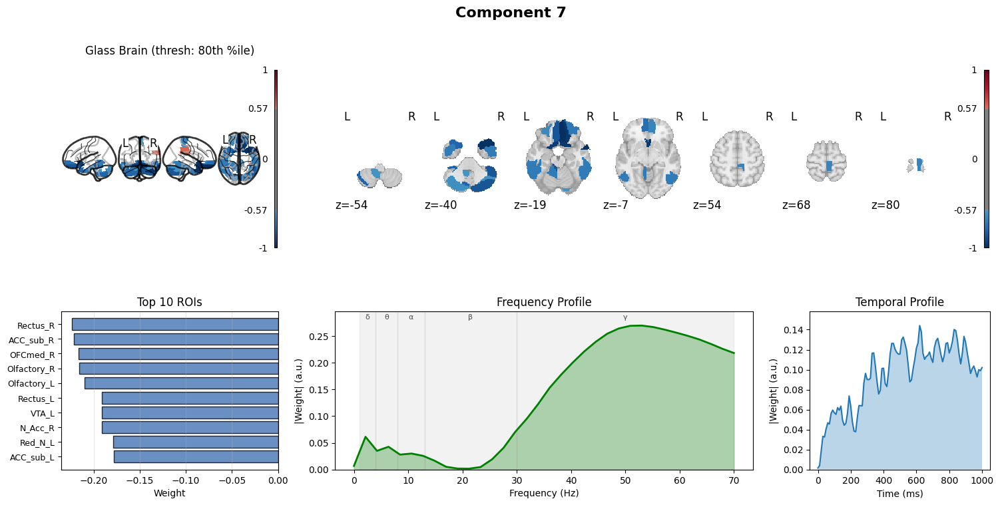


Component 7 Summary:
  Top 5 ROIs: ['Rectus_R', 'ACC_sub_R', 'OFCmed_R', 'Olfactory_R', 'Olfactory_L']
  Peak frequency: 53.0 Hz
  Peak time: 620 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


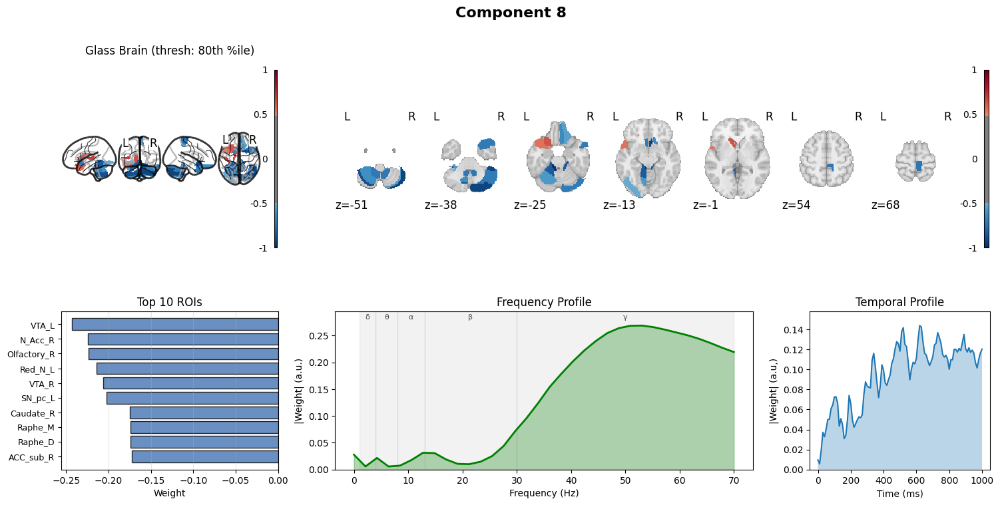


Component 8 Summary:
  Top 5 ROIs: ['VTA_L', 'N_Acc_R', 'Olfactory_R', 'Red_N_L', 'VTA_R']
  Peak frequency: 53.0 Hz
  Peak time: 620 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


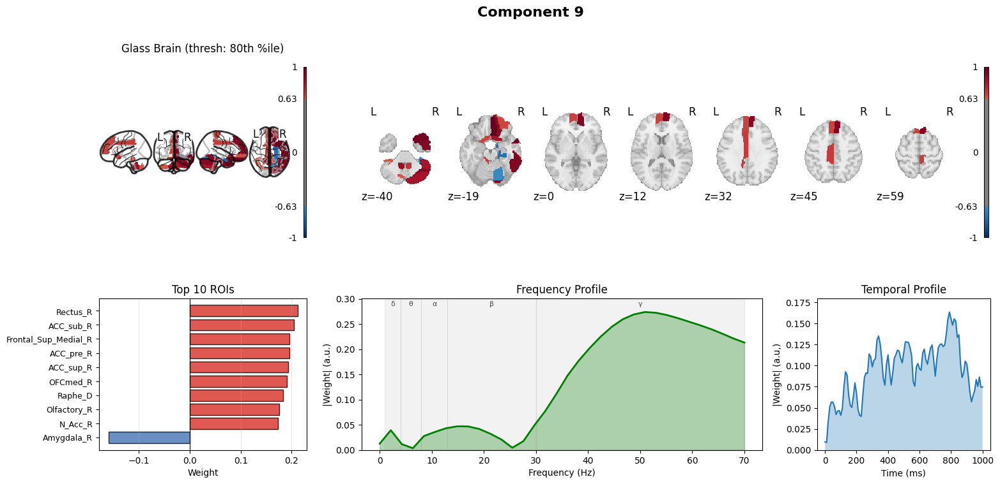


Component 9 Summary:
  Top 5 ROIs: ['Rectus_R', 'ACC_sub_R', 'Frontal_Sup_Medial_R', 'ACC_pre_R', 'ACC_sup_R']
  Peak frequency: 50.9 Hz
  Peak time: 790 ms


/tmp/ipython-input-2516781821.py:171: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


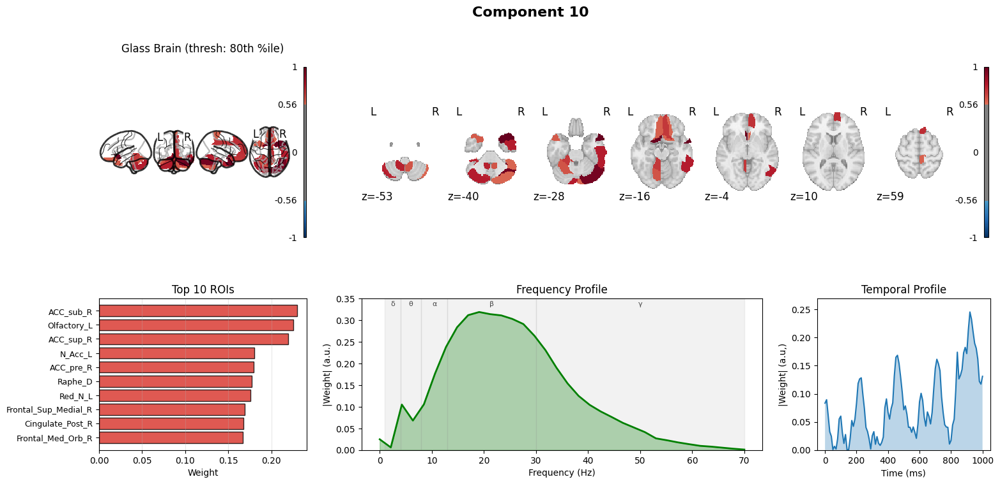


Component 10 Summary:
  Top 5 ROIs: ['ACC_sub_R', 'Olfactory_L', 'ACC_sup_R', 'N_Acc_L', 'ACC_pre_R']
  Peak frequency: 19.1 Hz
  Peak time: 920 ms


In [ ]:
plot_factors_on_atlas(A,B,C,labels_no_thal_vermis_cerebellum, labels_no_thal_vermis_cerebellum, aal_nifti_path, threshold_percentile=80)

In [ ]:
ranks = range(1,25,1)

r2_scores = []

for r in ranks:

  cp_tensor = parafac(tensor_no_thal_vermis_cerebellum_torch, rank=r, random_state=None, n_iter_max=5000, tol=1e-9, init='svd')

  r2 = r_squared(tensor_no_thal_vermis_cerebellum_torch,cp_tensor)

  r2_scores.append(r2)

(0.0, 1.0)

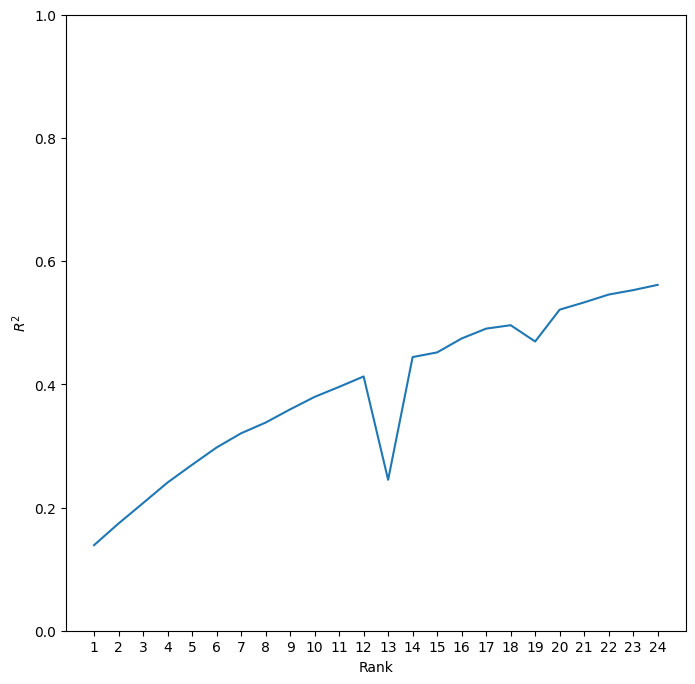

In [ ]:
plt.figure(figsize=(8,8))
plt.ylabel(fr'$R^2$')
plt.xlabel('Rank')
plt.xticks(ranks)
plt.plot(ranks, r2_scores)
plt.ylim(0,1)